In [267]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import re
from bs4 import BeautifulSoup
import requests as req
import json
from tqdm import tqdm

# useful tools

In [268]:
def sum_dict(d1,d2):
    return {k: d1.get(k, 0) + d2.get(k, 0) for k in set(d1) | set(d2)}

In [269]:
def subsets(s):
    sl=list(s)
    return [{sl[0],sl[1]},{sl[0],sl[2]},{sl[1],sl[2]}]

subsets({'Herdegrize', 'Oshimo', 'Terra Cogita'})   

[{'Herdegrize', 'Oshimo'},
 {'Herdegrize', 'Terra Cogita'},
 {'Oshimo', 'Terra Cogita'}]

In [270]:
def dict_count_val_over(dic,limit):
    count=0
    for v in dic.values():
        if v>limit:
            count+=1
    return count

In [271]:
def dict_barh(dic,title="michel",sort=False,save=False,sortby="no_sort_df"):
    
    if sort:
        dic_s=dict(sorted(dic.items(), key=lambda item: item[1]))
    else:
        if sortby!="no_sort_df":    
            sortby_s=dict(sorted(sortby.items(), key=lambda item: item[1]))

            dic_s=dict()
            for k in sortby_s.keys():
                dic_s[k]=dic[k]
        else:
            dic_s=dic
    compp=dic_s.items()
    x, y = zip(*compp)   
    # print(x,y)
    offset_text=(max(y)/60)

    fig, ax=plt.subplots(figsize=(10,5),facecolor='#7B7826')
    ax.set_facecolor("#B69E44")

    x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in x]
    ax.barh(x_strip, y,facecolor='#231D0F')
    for i in range(len(x)):
        ax.text( y[i]+offset_text,i, y[i], ha='left',va="center",color='black')

    if title!="michel":
        ax.set_title(title)
    plt.tight_layout()

    if save:
        plt.savefig("graphs/"+title+'.png')
    
    plt.show()

In [272]:
#fonction qui sert à filtrer et enlever les keys dont la valeur est en dessous de 3

def filterTheDict(dictObj, callback):
    newDict = dict()
    # Iterate over all the items in dictionary
    for (key, value) in dictObj.items():
        # Check if item satisfies the given condition then add to new dict
        if callback((key, value)):
            newDict[key] = value
    return newDict

In [273]:
def duo_to_list(s):
    spl=re.findall('[a-z]+',s)
    return spl

duo_to_list("{'eniripsa', 'iop'}")

['eniripsa', 'iop']

In [274]:
sl=["xelor",'zobal',"steamer"]
def alphab_sort(list):
    if list[0][0]>list[1][0]:
        if list[1][0]>list[2][0]:
            return list
        else:
            if list[0][0]>list[2][0]:
                return [list[0],list[2],list[1]]
            else:
                return [list[2],list[0],list[1]]
    else:
        if list[2][0]>list[1][0]:
            return [list[2],list[1],list[0]]
        else:
            if list[2][0]>list[0][0]:
                return [list[1],list[2],list[0]]
            else:
                return [list[1],list[0],list[2]]

alphab_sort(sl)

['zobal', 'xelor', 'steamer']

# import df

In [275]:
r=1
nb_ronde=1
df=pd.read_excel("team_JDA_tournament_phase_r"+str(r)+".xlsx",index_col="equipes")
# df=pd.read_excel("team_JDA_tournament_phase.xlsx",index_col="equipes")
ronde=pd.read_excel('resultats_ronde'+str(r)+'.xlsx',usecols=['equipe A','equipe B','vainqueur'])

# compo les plus jouées

In [276]:
def pickrate_compo(df,serveur="tous",filter=-1):
    
    if serveur!="tous":
        temp_df=df[df["serveur_team"]==serveur].copy()
        # title=serveur.upper()+" compo les plus jouées"
    else:
        temp_df=df.copy()
        # title="compo les plus jouées"

    compo_count=dict()

    
    for idx, row in temp_df.iterrows():
        # ss={row["classe_J1"],row["classe_J2"],row["classe_J3"]}
        ss=[row["classe_J1"],row["classe_J2"],row["classe_J3"]]
        ss.sort()

        if len(ss)>2:
            if str(ss) in compo_count.keys():
                compo_count[str(ss)]+=1
            else:
                compo_count[str(ss)]=1

    if filter=="auto":
        temp_filter=0
        while(dict_count_val_over(compo_count,temp_filter)>25):
            temp_filter+=1
        if temp_filter>0:
            compo_count=filterTheDict(compo_count, lambda elem : elem[1] > temp_filter)

    elif filter>=0:
        compo_count=filterTheDict(compo_count, lambda elem : elem[1] > filter)

    # dict_barh(compo_count,sort=True,title=title)
    return compo_count

In [277]:

dict(sorted(pickrate_compo(df).items(), key=lambda item: item[1]))


{"['cra', 'ecaflip', 'steamer']": 1,
 "['roublard', 'sram', 'steamer']": 1,
 "['iop', 'pandawa', 'steamer']": 1,
 "['ecaflip', 'sacrieur', 'sram']": 1,
 "['iop', 'roublard', 'xelor']": 1,
 "['eniripsa', 'iop', 'roublard']": 1,
 "['ecaflip', 'enutrof', 'zobal']": 1,
 "['pandawa', 'sadida', 'steamer']": 1,
 "['iop', 'osamodas', 'sram']": 1,
 "['cra', 'ecaflip', 'feca']": 1,
 "['iop', 'sacrieur', 'sadida']": 1,
 "['eniripsa', 'iop', 'sram']": 1,
 "['ecaflip', 'iop', 'xelor']": 1,
 "['ecaflip', 'iop', 'steamer']": 1,
 "['feca', 'iop', 'steamer']": 1,
 "['eniripsa', 'enutrof', 'iop']": 1,
 "['cra', 'iop', 'zobal']": 1,
 "['ecaflip', 'enutrof', 'sacrieur']": 2,
 "['ecaflip', 'enutrof', 'feca']": 2,
 "['pandawa', 'sacrieur', 'sadida']": 2,
 "['eniripsa', 'enutrof', 'sram']": 2,
 "['ecaflip', 'roublard', 'steamer']": 2,
 "['enutrof', 'feca', 'steamer']": 2,
 "['cra', 'sacrieur', 'sadida']": 2,
 "['feca', 'roublard', 'steamer']": 2,
 "['ecaflip', 'enutrof', 'sadida']": 3,
 "['feca', 'pandawa', 

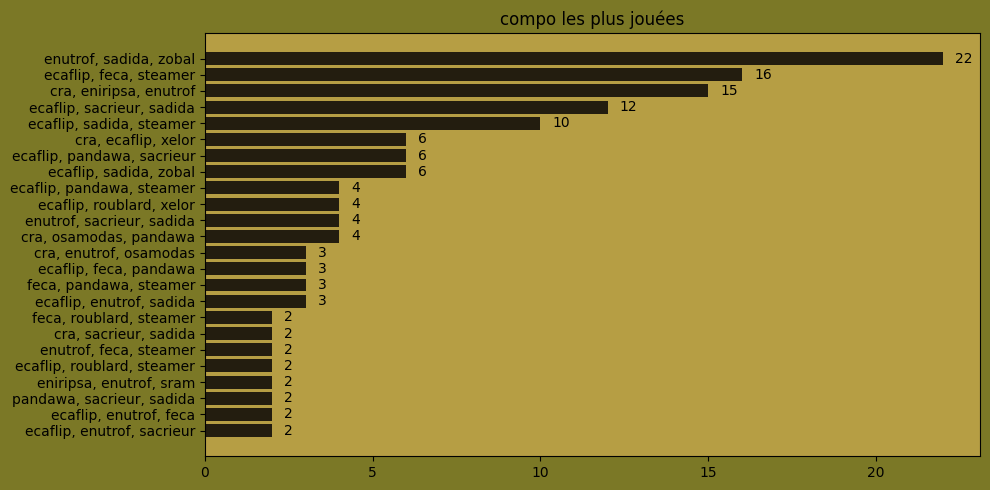

In [278]:
dict_barh(pickrate_compo(df,filter="auto"),sort=True,title="compo les plus jouées")

# pickrate des classes

In [279]:
def pickrate_classes(df,serveur="tous"):
   list_classes=['xelor', 'enutrof', 'eniripsa', 'osamodas', 'zobal', 'sadida',
       'steamer', 'sacrieur', 'iop', 'pandawa', 'ecaflip', 'cra', 'feca',
       'sram', 'roublard']
   base=dict()
   # list_classes=df["classe_J1"].unique()
   for c in list_classes:
      base[c]=0

   if serveur=="tous":
      temp_df=df
   else:
      temp_df=df[df['serveur_team']==serveur]

   j1=temp_df.groupby(by=["classe_J1"]).count()["serveur_team"].to_dict()
   j2=temp_df.groupby(by=["classe_J2"]).count()["serveur_team"].to_dict()
   j3=temp_df.groupby(by=["classe_J3"]).count()["serveur_team"].to_dict()
   
   pick_c=sum_dict(sum_dict(sum_dict(base,j1),j2),j3)

   return pick_c

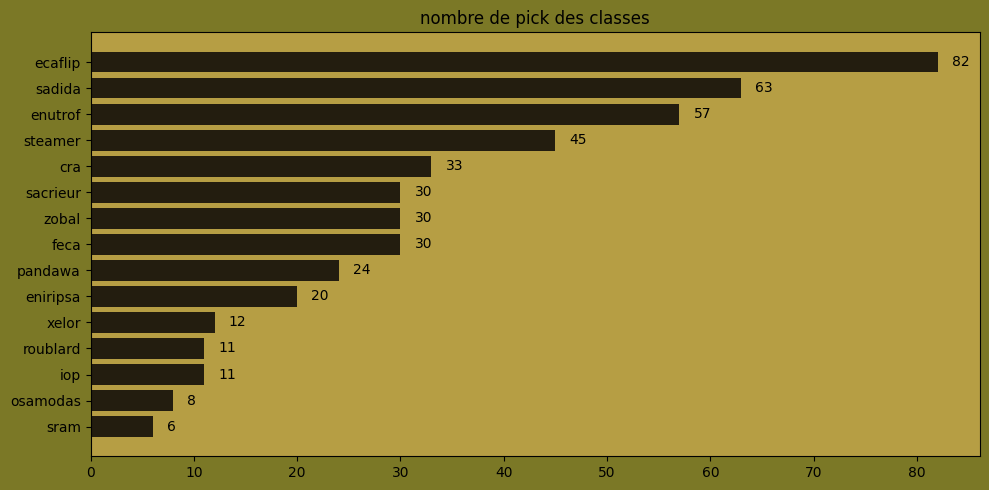

In [280]:
dict_barh(pickrate_classes(df),sort=True,title="nombre de pick des classes")

# Nombre de teams par serveur

In [281]:
list_serv=df["serveur_team"].unique()
list_serv

array(['Kelerog', 'Interserveur', 'Blair', 'Non défini', 'Tiliwan',
       'Talok'], dtype=object)

In [282]:
serv_team_count=df.groupby(by=["serveur_team"]).count()["J1"].to_dict()
serv_team_count

{'Blair': 38,
 'Interserveur': 16,
 'Kelerog': 65,
 'Non défini': 4,
 'Talok': 11,
 'Tiliwan': 20}

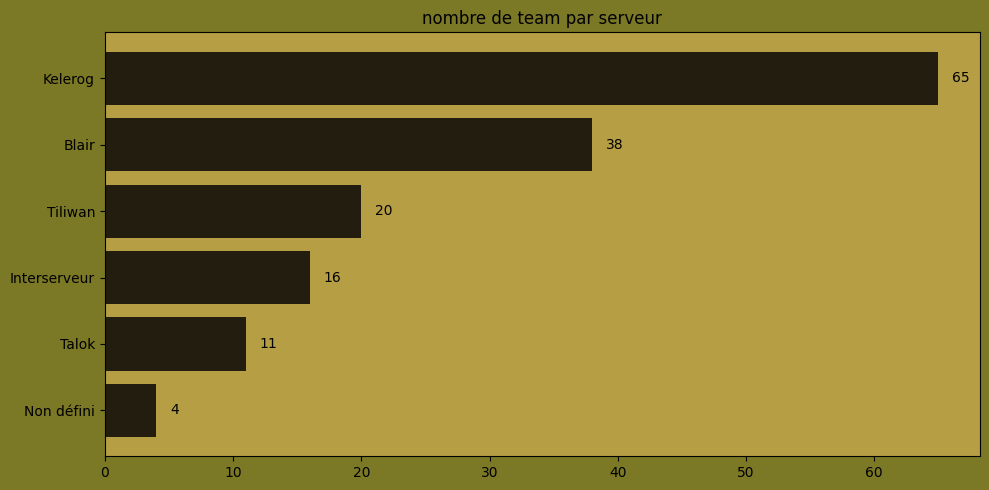

In [283]:
dict_barh(serv_team_count,sort=True,title="nombre de team par serveur")

# Nombre de joueurs par serveur

In [284]:
j1_serv=df.groupby(by="serveur_J1_cleaned").count()["J1"].to_dict()
j2_serv=df.groupby(by="serveur_J2_cleaned").count()["J1"].to_dict()
j3_serv=df.groupby(by="serveur_J3_cleaned").count()["J1"].to_dict()

serv_joueur=sum_dict(sum_dict(j1_serv,j2_serv),j3_serv)
serv_joueur

{'Kelerog': 217, 'Non défini': 12, 'Blair': 119, 'Talok': 38, 'Tiliwan': 76}

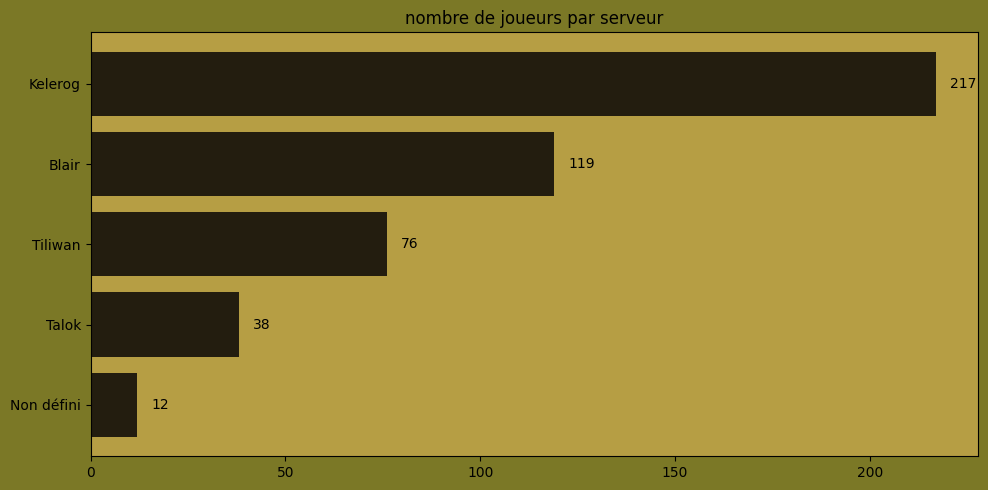

In [285]:
dict_barh(serv_joueur,sort=True,title="nombre de joueurs par serveur")

# Les duos les plus joués

In [286]:
def pickrate_duos(df,serveur="tous",filter=-1):
    
    if serveur!="tous":
        temp_df=df[df["serveur_team"]==serveur].copy()
        # title=serveur.upper()+" duos les plus jouées"
    else:
        temp_df=df.copy()
        # title="duos les plus jouées"

    duo_count=dict()
    
    for idx, row in temp_df.iterrows():
        # ss={row["classe_J1"],row["classe_J2"],row["classe_J3"]}
        ss=[row["classe_J1"],row["classe_J2"],row["classe_J3"]]
        ss.sort()
        if len(ss)==2:
            if str(ss) in duo_count.keys():
                duo_count[str(ss)]+=1
            else:
                duo_count[str(ss)]=1
        elif len(ss)==3:
            sub_list=subsets(ss)
            for sb in sub_list:
                if str(sb) in duo_count.keys():
                    duo_count[str(sb)]+=1
                else:
                    duo_count[str(sb)]=1

    if filter=="auto":
        temp_filter=0
        while(dict_count_val_over(duo_count,temp_filter)>25):
            temp_filter+=1
        if temp_filter>0:
            duo_count=filterTheDict(duo_count, lambda elem : elem[1] > temp_filter)
    elif filter>=0:
        duo_count=filterTheDict(duo_count, lambda elem : elem[1] > filter)

    # dict_barh(duo_count,sort=True,title=title)
    return duo_count

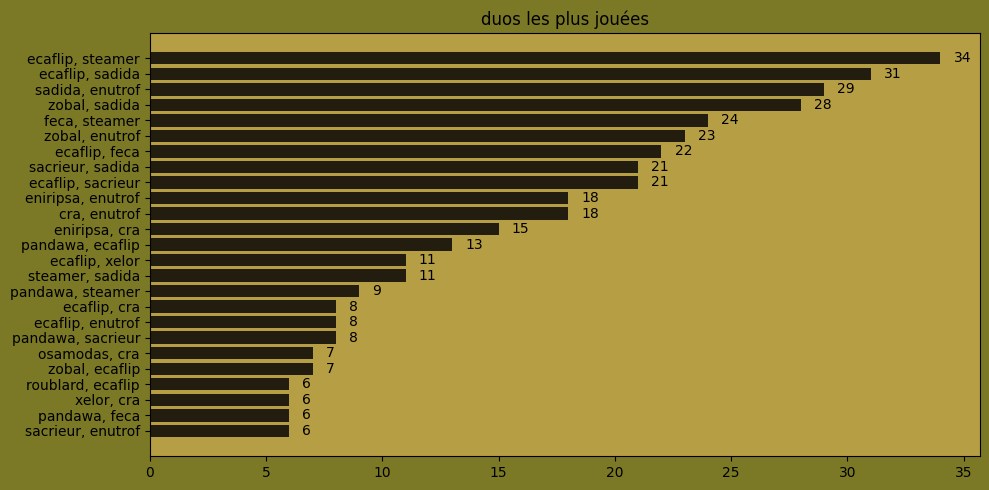

In [287]:
dict_barh(pickrate_duos(df,filter="auto"),sort=True,title="duos les plus jouées")

Heatmap duos - cool mais pas ouf 

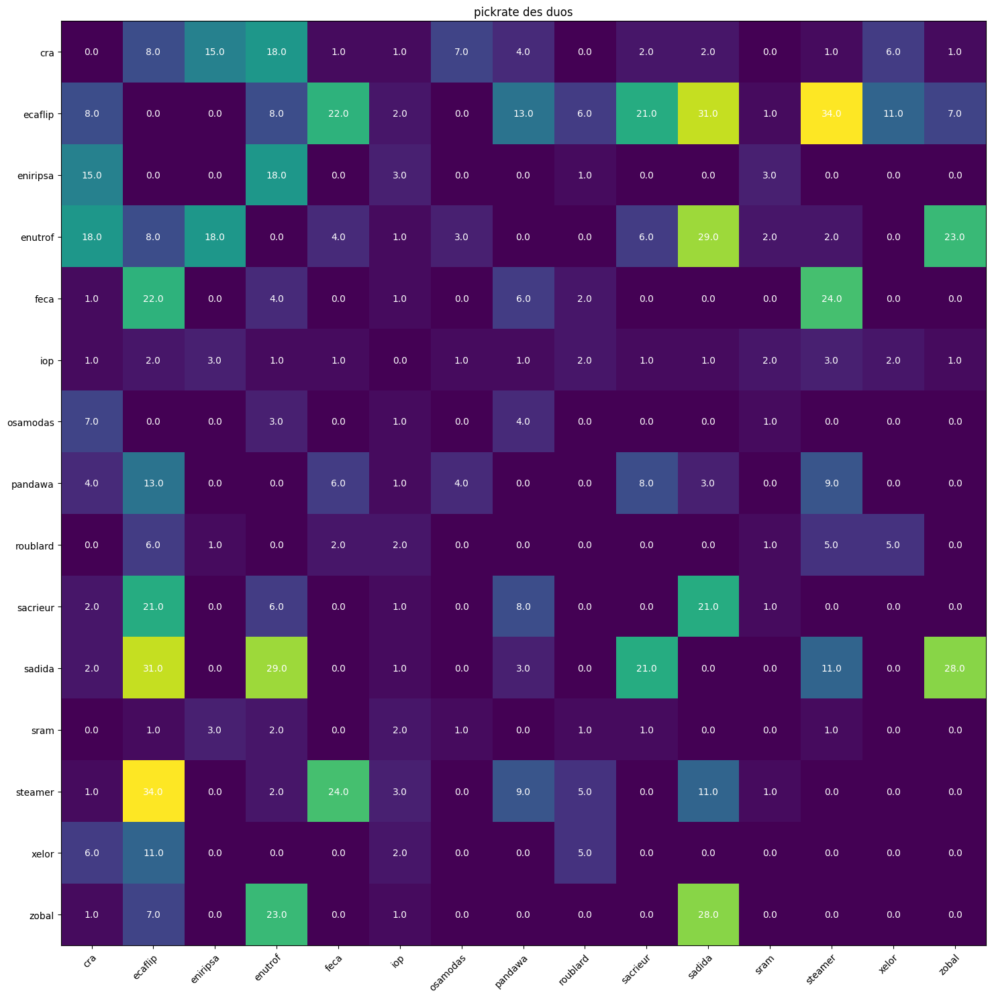

In [288]:
classes_names=["cra","ecaflip", 'eniripsa', 'enutrof', 'feca', 'iop', 'osamodas', 'pandawa', 'roublard', 'sacrieur', 'sadida', 'sram', 'steamer','xelor','zobal']

restri = np.zeros((len(classes_names),len(classes_names)))

duos=pickrate_duos(df)

for dudu in list(duos.keys()):
    l_dudu=duo_to_list(dudu)

    restri[classes_names.index(l_dudu[0])][classes_names.index(l_dudu[1])]=duos[dudu]
    restri[classes_names.index(l_dudu[1])][classes_names.index(l_dudu[0])]=duos[dudu]

# print(restri)

fig, ax = plt.subplots(figsize=(15,15))
im = ax.imshow(restri)

# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(classes_names)))#, labels=classes_names)
ax.set_yticks(np.arange(len(classes_names)))#, labels=classes_names)

# Set tick labels for both x and y axes
ax.set_xticklabels(classes_names, rotation=45, ha="right", rotation_mode="anchor")
ax.set_yticklabels(classes_names)

# Loop over data dimensions and create text annotations.
for i in range(len(classes_names)):
    for j in range(len(classes_names)):
        text = ax.text(j, i, restri[i, j],ha="center", va="center", color="w")


ax.set_title("pickrate des duos")
fig.tight_layout()
plt.show()

# Compo, duo, pickrate mais par serveur

### pickrate classes par serveur

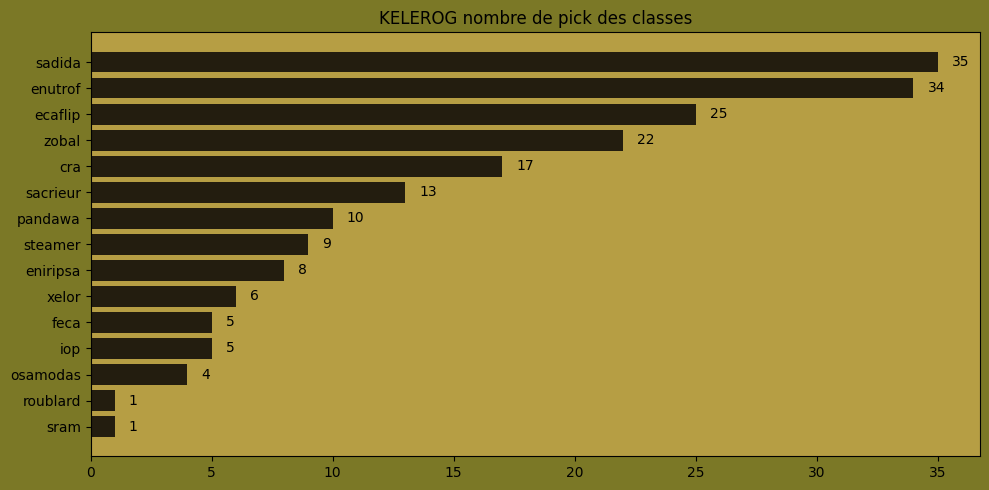

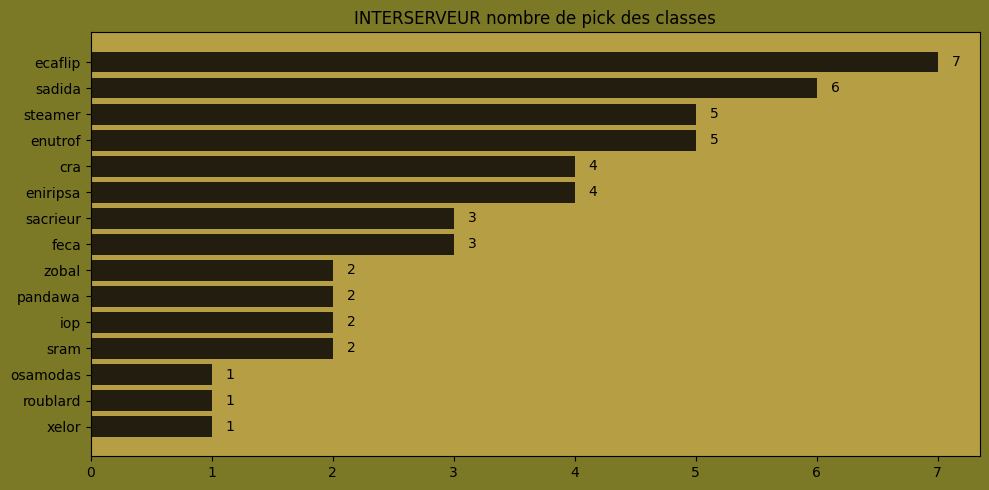

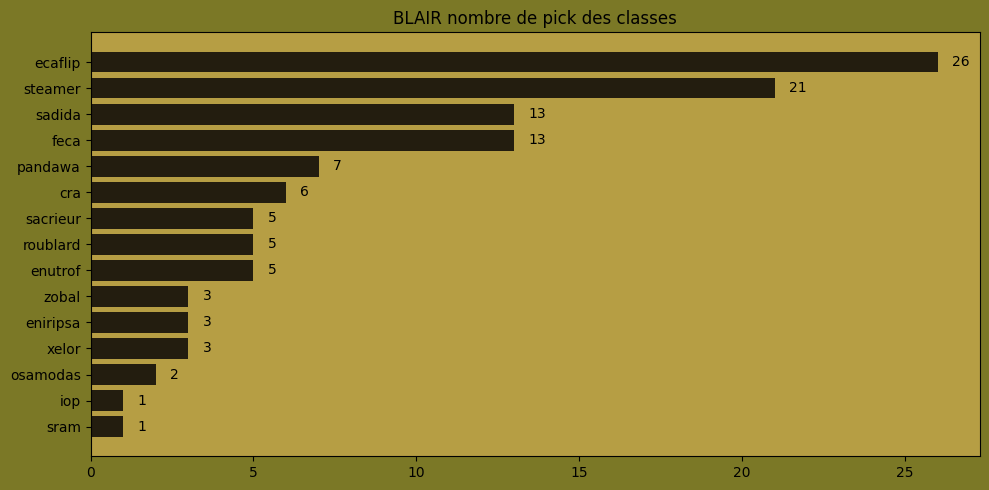

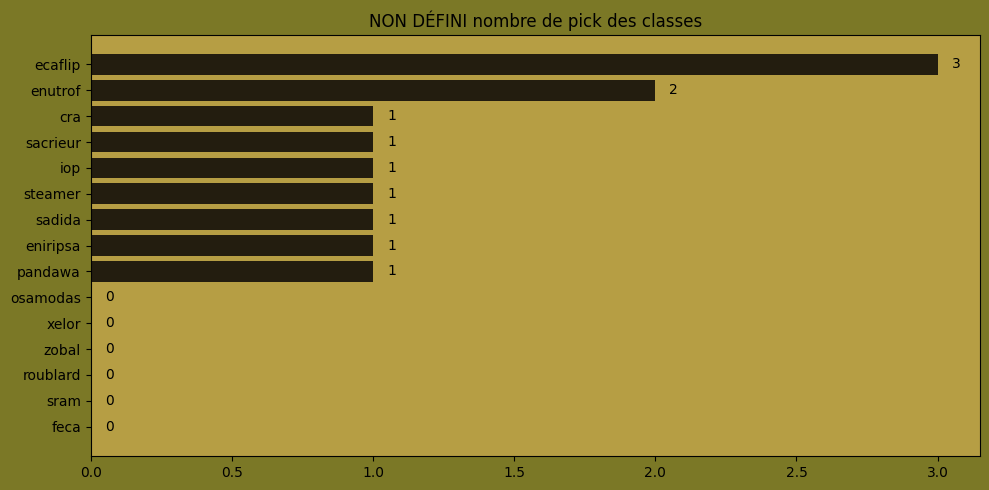

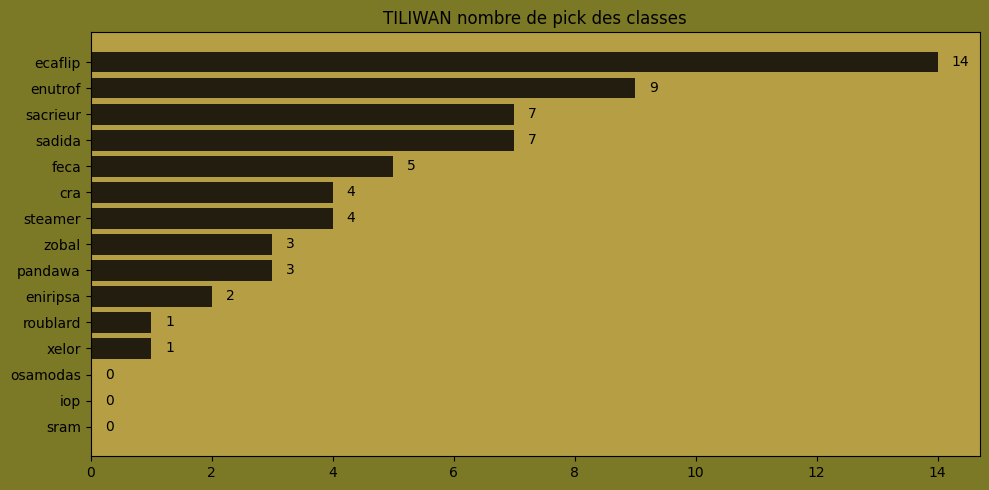

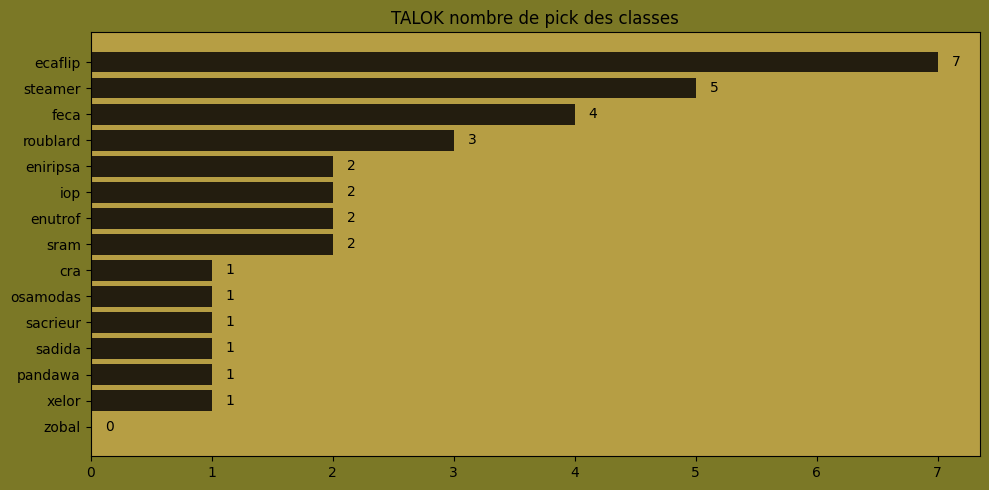

In [289]:
for sss in df["serveur_team"].unique():
    dict_barh(pickrate_classes(df,sss),sort=True,title=sss.upper()+" nombre de pick des classes")

### Compo les plus jouées par serveur

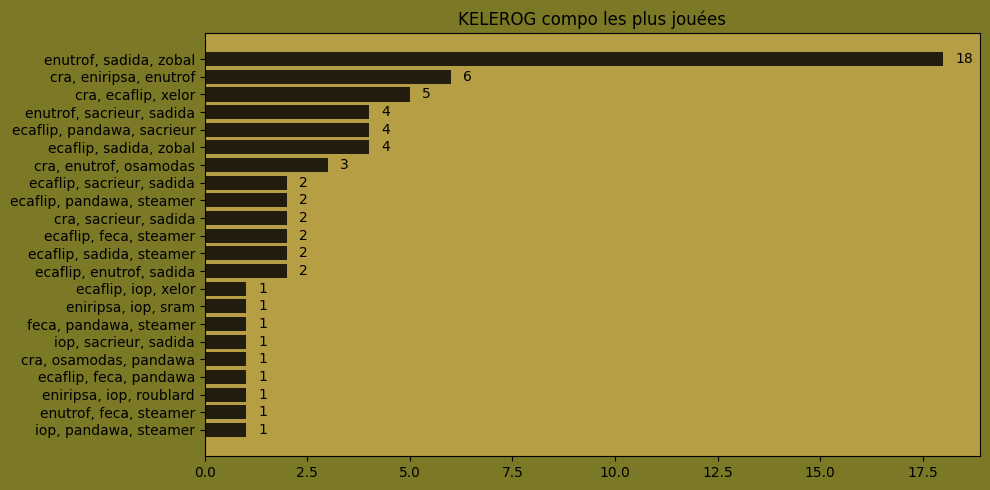

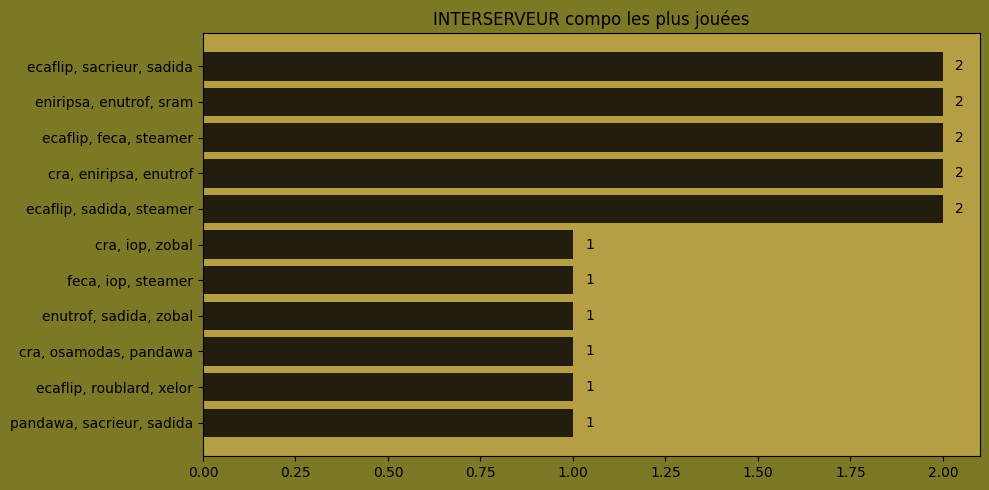

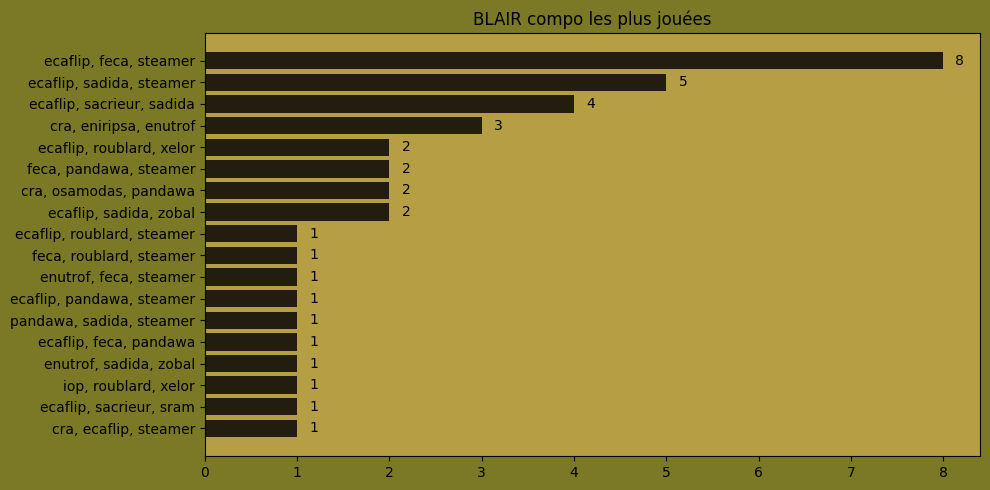

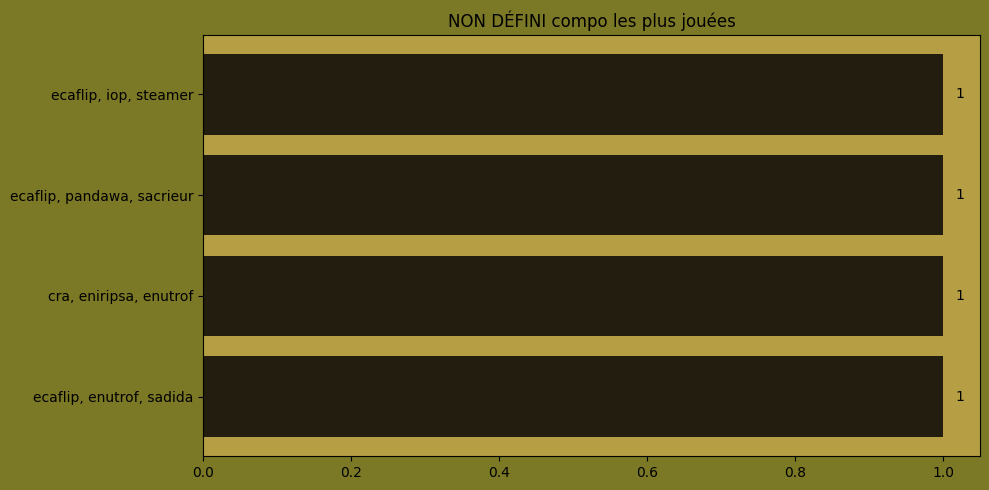

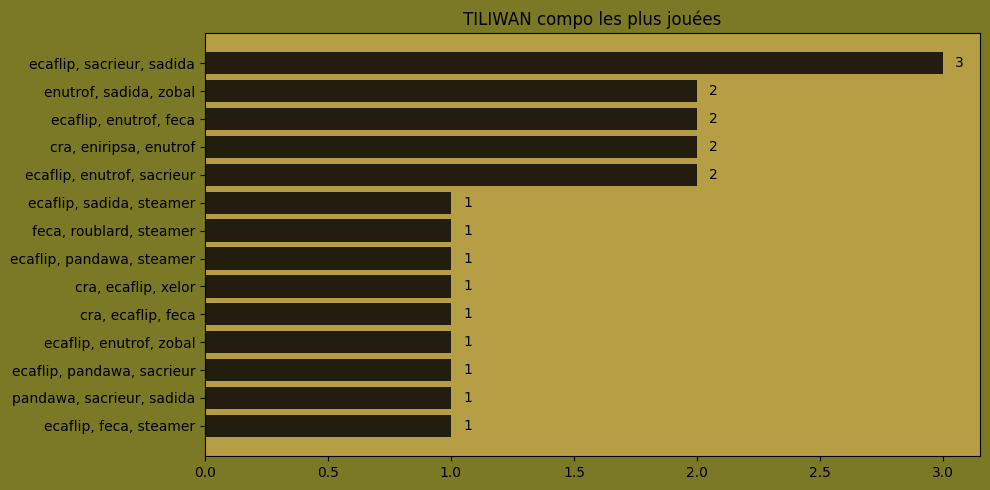

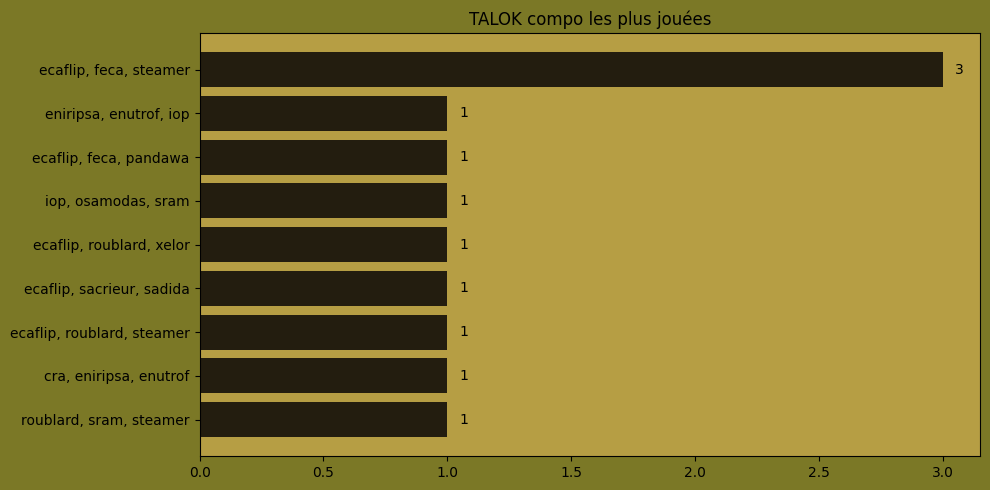

In [290]:
for sss in df["serveur_team"].unique():
    dict_barh(pickrate_compo(df,serveur=sss,filter="auto"),sort=True,title=sss.upper()+" compo les plus jouées")

### Duos les plus joués par serveur

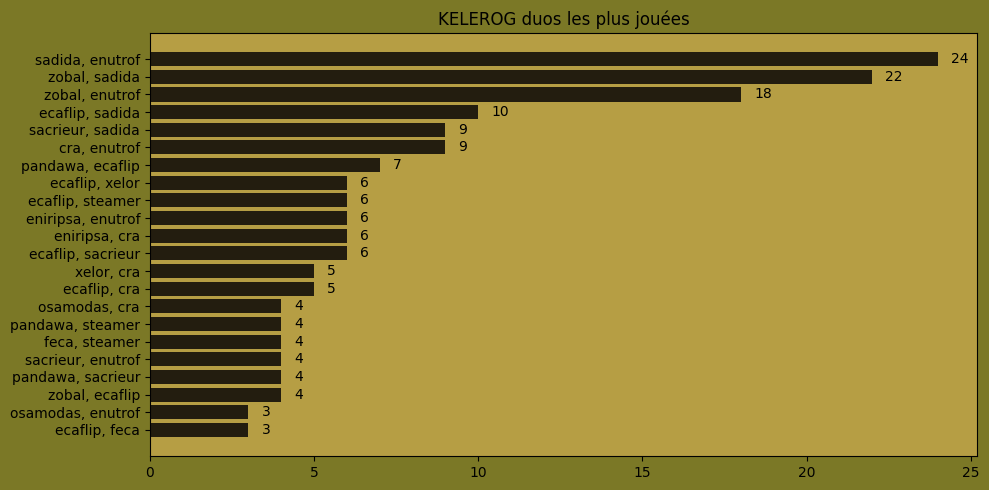

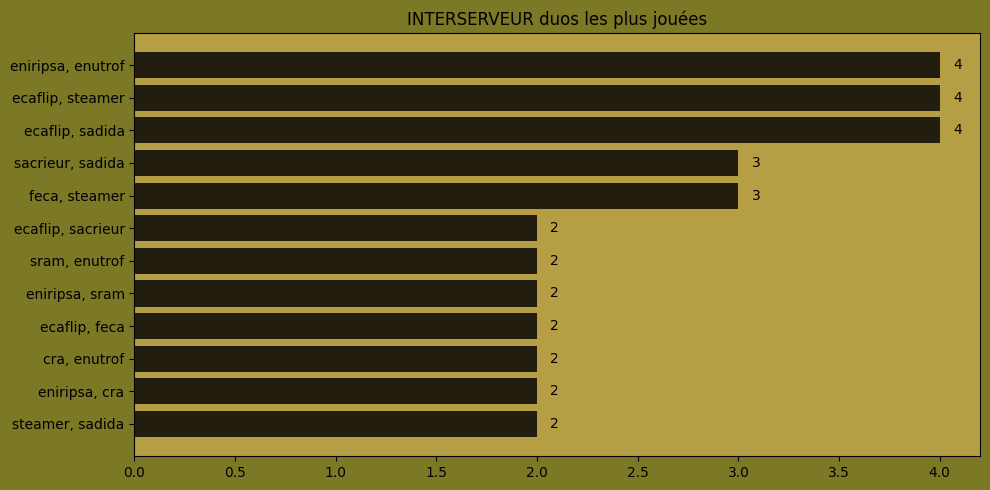

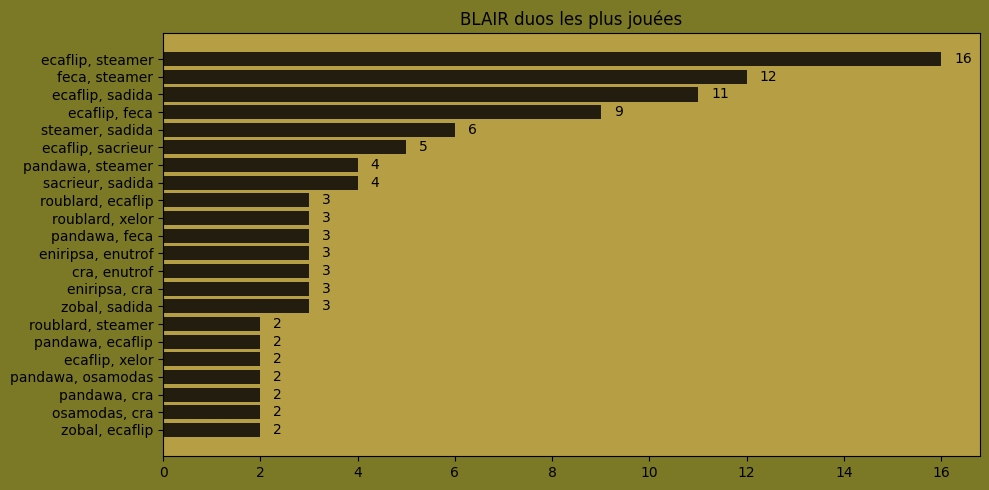

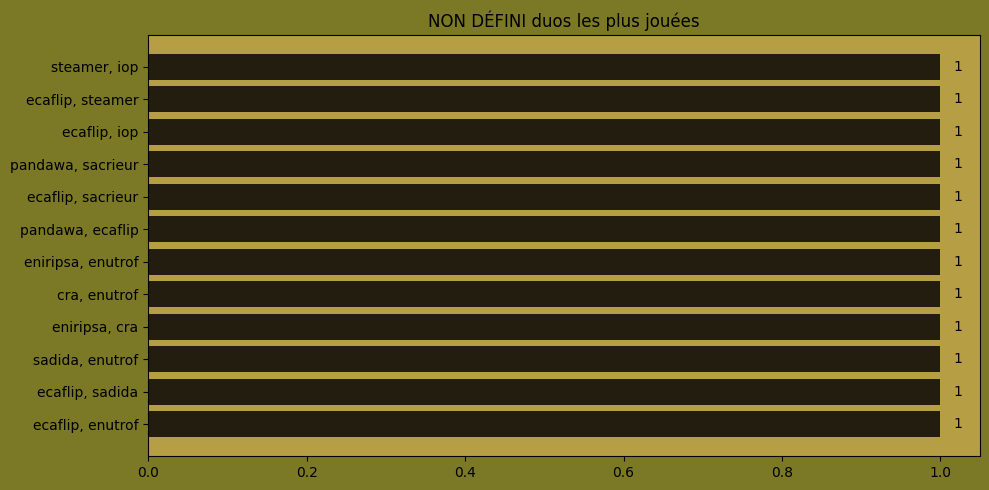

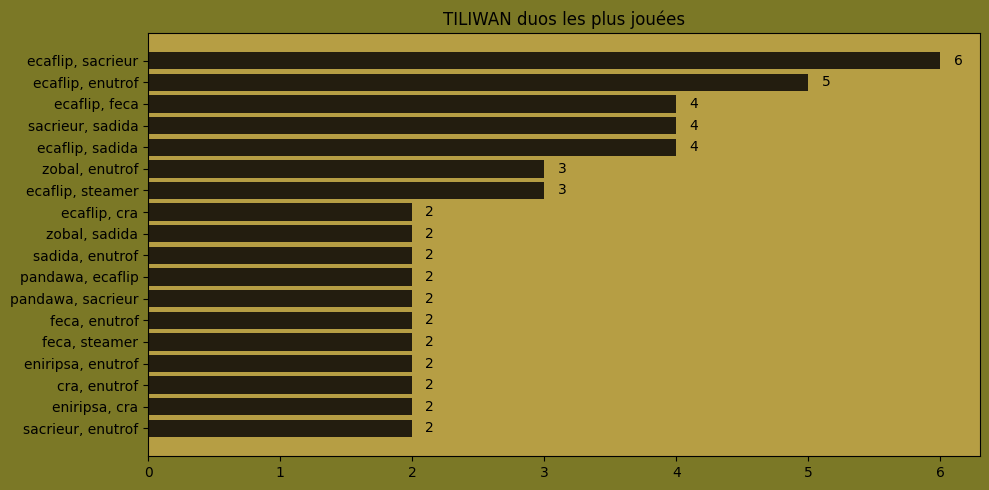

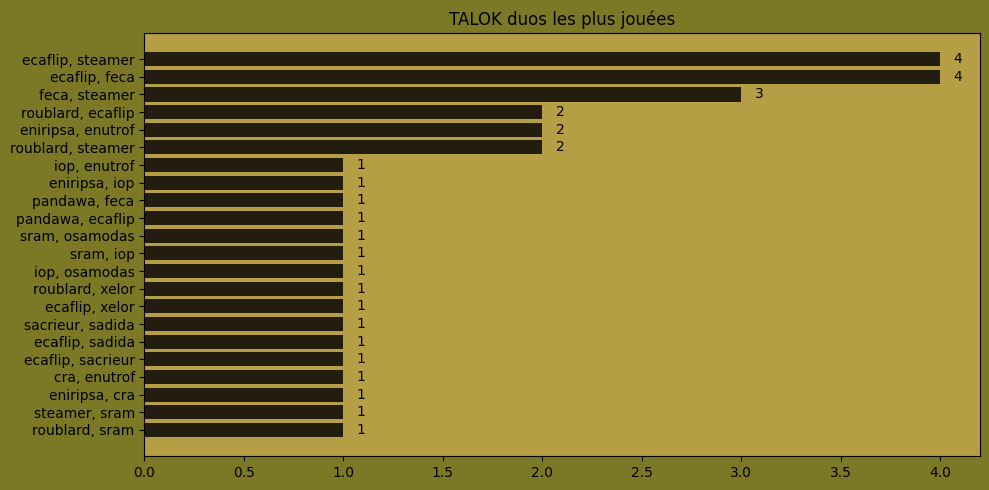

In [291]:
for sss in df["serveur_team"].unique():
    dict_barh(pickrate_duos(df,serveur=sss,filter="auto"),sort=True,title=sss.upper()+" duos les plus jouées")

# Classes recap

3 classes les plus pick avec
la compo dans laquelle elle est la plus présente
serveur qui aime le plus la classe (en % de ses joueurs)



# Serveurs recap

In [292]:
def recap_serv(df,serv="tous",color_panel={
    "background_col":"#818181",
    "plot_col":"#D9D9D9",
    "bars_col":"#D1AA35" 
}   ):
    classes=pickrate_classes(df,serv)
    compos=pickrate_compo(df,serv,filter='auto')
    duos=pickrate_duos(df,serv,filter='auto')

    background_col=color_panel["background_col"]#"#B75888"
    plot_col=color_panel["plot_col"]#"#DF6DBC"
    bars_col=color_panel["bars_col"]#"#55185A"
    
    fig, axs=plt.subplots(2,2,figsize=(20,10),facecolor=background_col)

    #Classes
    axs[0][1].set_facecolor(plot_col)
    axs[0][1].set_title("pickrate des classes")
    classes_s=dict(sorted(classes.items(), key=lambda item: item[1]))
    classes_s_i=classes_s.items()
    classes_x, classes_y = zip(*classes_s_i)   
    classes_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in classes_x]

    offset_text_classes=(max(classes_y)/60)


    axs[0][1].barh(classes_x_strip, classes_y,facecolor=bars_col)
    for i in range(len(classes_x)):
        axs[0][1].text( classes_y[i]+offset_text_classes,i, classes_y[i], ha='left',va="center",color='black')

    #Compos
    axs[1][0].set_facecolor(plot_col)
    axs[1][0].set_title("pickrate des compos")
    compos_s=dict(sorted(compos.items(), key=lambda item: item[1]))
    compos_s_i=compos_s.items()
    compos_x, compos_y = zip(*compos_s_i)   
    compos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in compos_x]

    offset_text_compos=(max(compos_y)/60)


    axs[1][0].barh(compos_x_strip, compos_y,facecolor=bars_col)
    for i in range(len(compos_x)):
        axs[1][0].text( compos_y[i]+offset_text_compos,i, compos_y[i], ha='left',va="center",color='black')

    #Duos
    axs[1][1].set_facecolor(plot_col)
    axs[1][1].set_title("pickrate des duos")
    duos_s=dict(sorted(duos.items(), key=lambda item: item[1]))
    duos_s_i=duos_s.items()
    duos_x, duos_y = zip(*duos_s_i)   
    duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_duos=(max(duos_y)/60)


    axs[1][1].barh(duos_x_strip, duos_y,facecolor=bars_col)
    for i in range(len(duos_x)):
        axs[1][1].text( duos_y[i]+offset_text_duos,i, duos_y[i], ha='left',va="center",color='black')

    #Imageplt.imshow(mpimg.imread('MyImage.png'))
    try:
        axs[0][0].imshow(mpimg.imread("images/4_"+serv.lower()+".png"))
    except:
        axs[0][0].imshow(mpimg.imread("images/Interserveur.jpg"))
    axs[0][0].get_xaxis().set_visible(False)
    axs[0][0].get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.savefig("graphs/"+serv.replace(" ","_")+"_recaputilatif.png")
    plt.show()

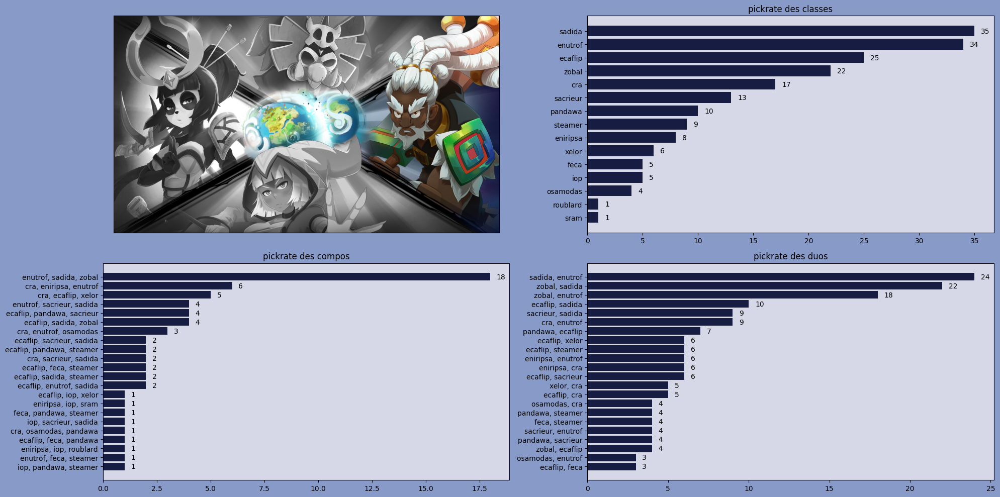

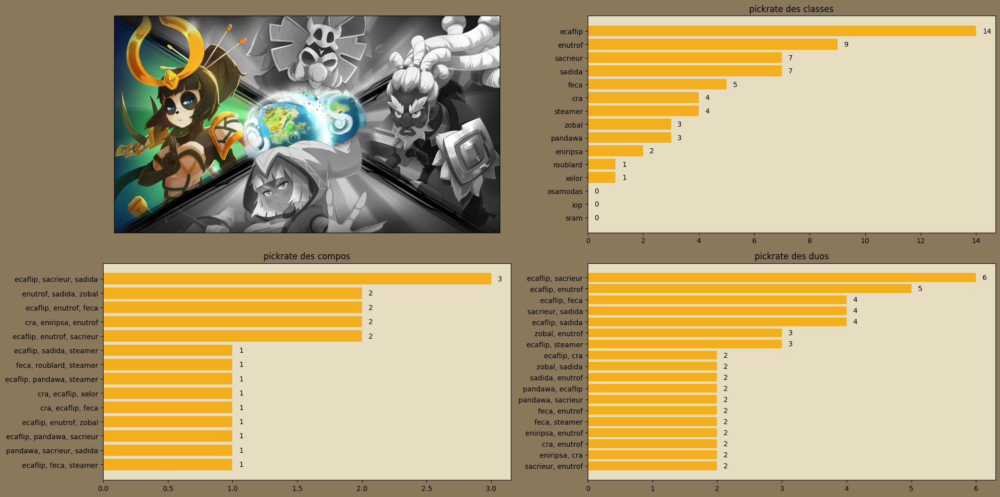

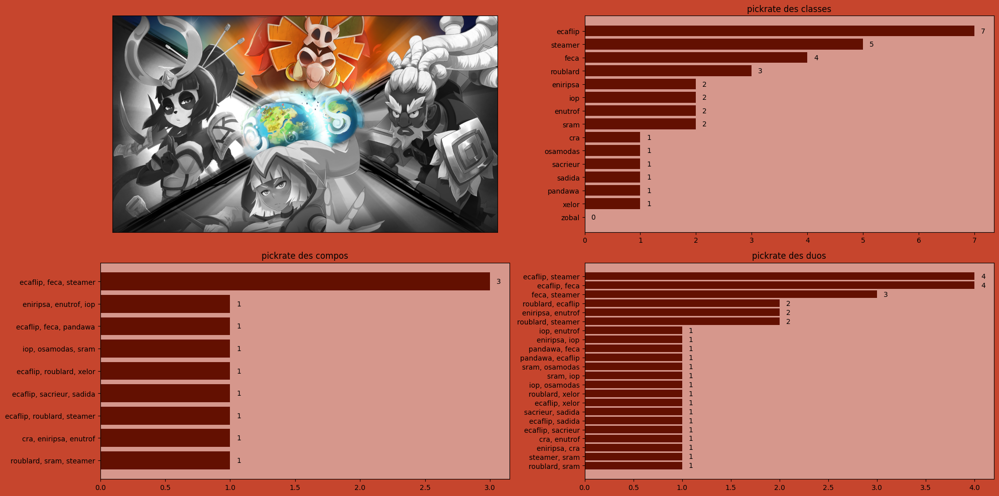

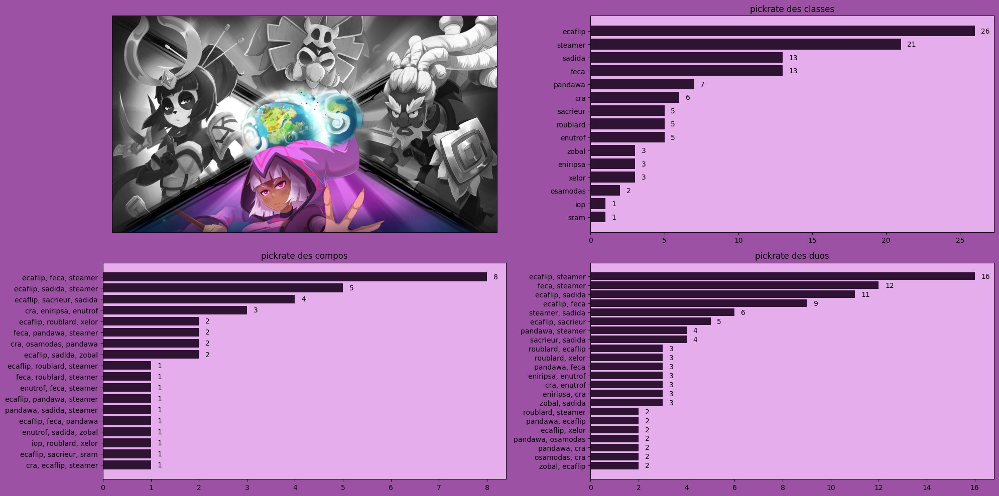

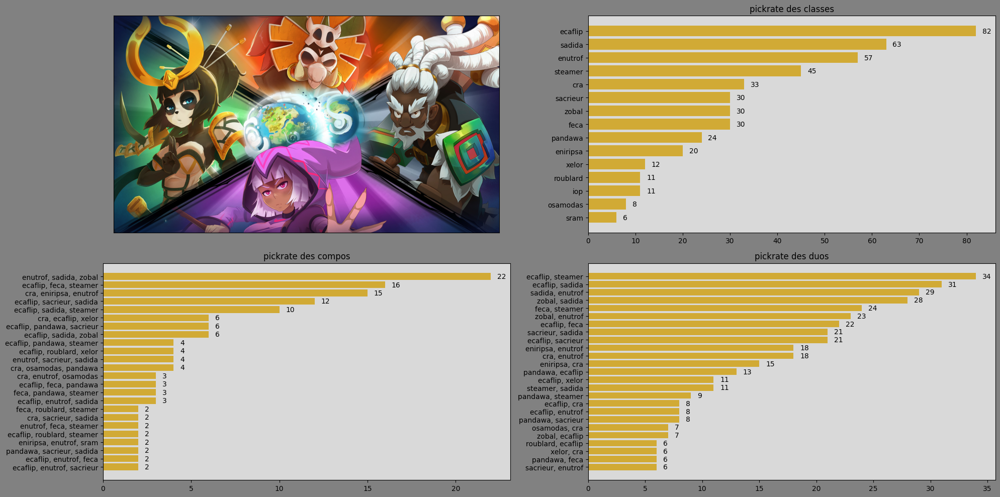

In [293]:
herde_panel={
    "background_col":"#B75888",
    "plot_col":"#DF6DBC",
    "bars_col":"#55185A" 
}   
oshi_panel={
    "background_col":"#588791",
    "plot_col":"#5A9CA8",
    "bars_col":"#162f3f" 
}   
terra_panel={
    "background_col":"#7F4C34",
    "plot_col":"#DCB47B",
    "bars_col":"#672C1C" 
}   
granda_panel={
    "background_col":"#7B7826",
    "plot_col":"#B69E44",
    "bars_col":"#231D0F" 
}   
brutas_panel={
    "background_col":"#C76048",
    "plot_col":"#F9B67E",
    "bars_col":"#55201C" 
}   
inter_panel={
    "background_col":"#818181",
    "plot_col":"#D9D9D9",
    "bars_col":"#D1AA35" 
}   
kele_panel={
    "background_col":"#889ac7",
    "plot_col":"#d6d8e8",
    "bars_col":"#171c42" 
}   
tili_panel={
    "background_col":"#89785A",
    "plot_col":"#e7dec1",
    "bars_col":"#f3af1e" 
}   
talok_panel={
    "background_col":"#c6452d",
    "plot_col":"#d6978c",
    "bars_col":"#631001" 
}   
blair_panel={
    "background_col":"#9d51a5",
    "plot_col":"#e5adec",
    "bars_col":"#2e1432" 
}   

recap_serv(df,"Kelerog",kele_panel)
recap_serv(df,"Tiliwan",tili_panel)
recap_serv(df,"Talok",talok_panel)
recap_serv(df,"Blair",blair_panel)

# recap_serv(df,"Herdegrize",herde_panel)
# recap_serv(df,"Oshimo",oshi_panel)
# recap_serv(df,"Terra Cogita",terra_panel)
# recap_serv(df,"Grandapan",granda_panel)
# recap_serv(df,"Dodge",inter_panel)
# recap_serv(df,"Brutas",brutas_panel)
recap_serv(df)

# recap global

In [294]:
def recap_global(df):
    
    color_panel={"background_col":"#93B79D","plot_col":"#A8C6AE","bars_col":"#253C35"}
    classes=pickrate_classes(df)
    compos=pickrate_compo(df,filter='auto')
    duos=pickrate_duos(df,filter='auto')
    nb_team=df.groupby(by=["serveur_team"]).count()["J1"].to_dict()
    nb_joueurs=sum_dict(sum_dict(df.groupby(by="serveur_J1_cleaned").count()["J1"].to_dict(),df.groupby(by="serveur_J2_cleaned").count()["J1"].to_dict()),df.groupby(by="serveur_J3_cleaned").count()["J1"].to_dict())
    
    background_col=color_panel["background_col"]#"#B75888"
    plot_col=color_panel["plot_col"]#"#DF6DBC"
    bars_col=color_panel["bars_col"]#"#55185A"
    
    fig, axs=plt.subplots(3,2,figsize=(20,15),facecolor=background_col)


    #########################################
    #Classes
    #########################################

    axs[0][1].set_facecolor(plot_col)
    axs[0][1].set_title("pickrate des classes")
    classes_s=dict(sorted(classes.items(), key=lambda item: item[1]))
    classes_s_i=classes_s.items()
    classes_x, classes_y = zip(*classes_s_i)   
    classes_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in classes_x]

    offset_text_classes=(max(classes_y)/60)


    axs[0][1].barh(classes_x_strip, classes_y,facecolor=bars_col)
    for i in range(len(classes_x)):
        axs[0][1].text( classes_y[i]+offset_text_classes,i, classes_y[i], ha='left',va="center",color='black')


    #########################################
    #Compos
    #########################################

    axs[1][0].set_facecolor(plot_col)
    axs[1][0].set_title("pickrate des compos")
    compos_s=dict(sorted(compos.items(), key=lambda item: item[1]))
    compos_s_i=compos_s.items()
    compos_x, compos_y = zip(*compos_s_i)   
    compos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in compos_x]

    offset_text_compos=(max(compos_y)/60)


    axs[1][0].barh(compos_x_strip, compos_y,facecolor=bars_col)
    for i in range(len(compos_x)):
        axs[1][0].text( compos_y[i]+offset_text_compos,i, compos_y[i], ha='left',va="center",color='black')


    #########################################
    #Duos
    #########################################

    axs[1][1].set_facecolor(plot_col)
    axs[1][1].set_title("pickrate des duos")
    duos_s=dict(sorted(duos.items(), key=lambda item: item[1]))
    duos_s_i=duos_s.items()
    duos_x, duos_y = zip(*duos_s_i)   
    duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_duos=(max(duos_y)/60)


    axs[1][1].barh(duos_x_strip, duos_y,facecolor=bars_col)
    for i in range(len(duos_x)):
        axs[1][1].text( duos_y[i]+offset_text_duos,i, duos_y[i], ha='left',va="center",color='black')


    #########################################
    #nombre de team par serveur
    #########################################

    axs[2][0].set_facecolor(plot_col)
    axs[2][0].set_title("nombre de teams par serveur")
    team_s=dict(sorted(nb_team.items(), key=lambda item: item[1]))
    team_s_i=team_s.items()
    team_x, team_y = zip(*team_s_i)   

    offset_text_team=(max(team_y)/60)


    axs[2][0].barh(team_x, team_y,facecolor=bars_col)
    for i in range(len(team_x)):
        axs[2][0].text( team_y[i]+offset_text_team,i, team_y[i], ha='left',va="center",color='black')


    #########################################
    #nombre de joueur par serveur
    #########################################

    axs[2][1].set_facecolor(plot_col)
    axs[2][1].set_title("nombre de joueurs par serveur")
    joueurs_s=dict(sorted(nb_joueurs.items(), key=lambda item: item[1]))
    joueurs_s_i=joueurs_s.items()
    joueurs_x, joueurs_y = zip(*joueurs_s_i)   

    offset_text_joueurs=(max(joueurs_y)/60)


    axs[2][1].barh(joueurs_x, joueurs_y,facecolor=bars_col)
    for i in range(len(joueurs_x)):
        axs[2][1].text( joueurs_y[i]+offset_text_joueurs,i, joueurs_y[i], ha='left',va="center",color='black')


    #########################################
    #image
    #########################################

    #Imageplt.imshow(mpimg.imread('MyImage.png'))
    axs[0][0].imshow(mpimg.imread("images/Interserveur.jpg"))#+".jpg"))
    axs[0][0].get_xaxis().set_visible(False)
    axs[0][0].get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.savefig("graphs/recaputilatif_global.jpg")
    plt.show()

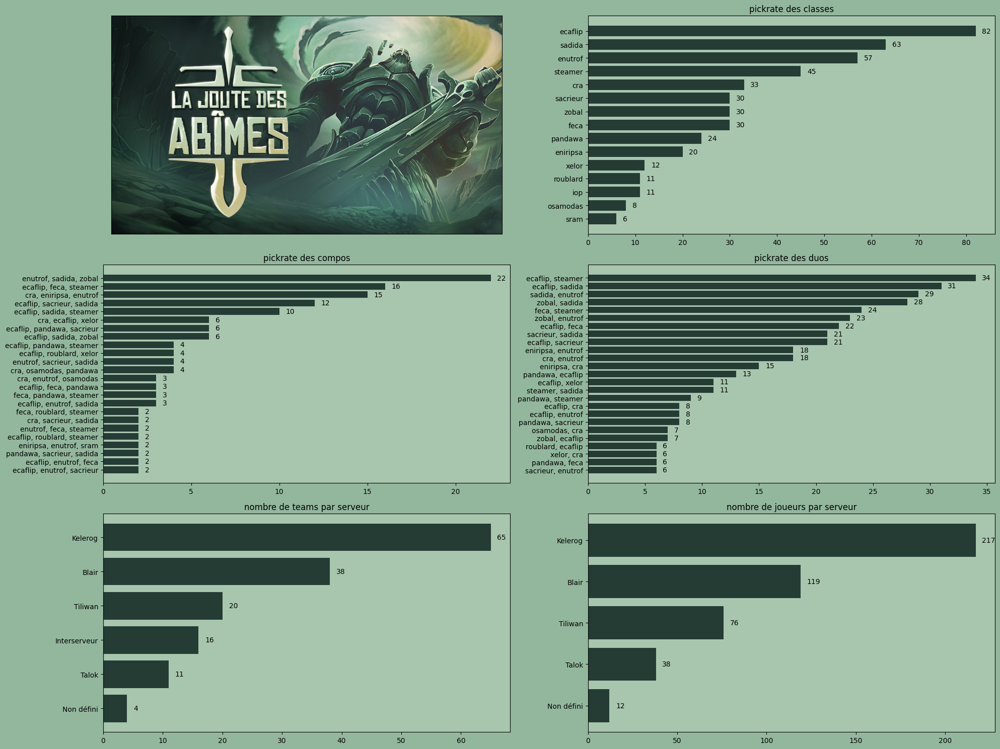

In [295]:
recap_global(df)

# winrate par compo

In [296]:
## winrate par compo
def winrate_compo(df,serveur="tous",filter=-1):
    
    if serveur!="tous":
        temp_df=df[df["serveur_team"]==serveur].copy()
        # title=serveur.upper()+" compo les plus jouées"
    else:
        temp_df=df.copy()
        # title="compo les plus jouées"

    compo_win=dict()

    
    for idx, row in temp_df.iterrows():
        ss=[row["classe_J1"],row["classe_J2"],row["classe_J3"]]
        ss.sort()
        # ss={row["classe_J1"],row["classe_J2"],row["classe_J3"]}
        if len(ss)>2:
            if str(ss) in compo_win.keys():
                compo_win[str(ss)]+=row["win"]/(row["loss"]+row["win"])
            else:
                compo_win[str(ss)]=row["win"]/(row["loss"]+row["win"])

    if filter=="auto":
        temp_filter=0
        while(dict_count_val_over(compo_win,temp_filter)>25):
            temp_filter+=1
        if temp_filter>0:
            compo_win=filterTheDict(compo_win, lambda elem : elem[1] > temp_filter)

    elif filter>=0:
        compo_win=filterTheDict(compo_win, lambda elem : elem[1] > filter)

    nb_compo=pickrate_compo(df,filter=filter)

    compo_wr=dict()

    for k in nb_compo:
        compo_wr[k]=int(compo_win[k]/nb_compo[k]*100)
    return compo_wr


In [297]:
compo_wr=winrate_compo(df)
compo_wr

{"['ecaflip', 'sadida', 'zobal']": 66,
 "['ecaflip', 'pandawa', 'sacrieur']": 66,
 "['ecaflip', 'sadida', 'steamer']": 60,
 "['cra', 'eniripsa', 'enutrof']": 80,
 "['ecaflip', 'sacrieur', 'sadida']": 33,
 "['ecaflip', 'enutrof', 'sadida']": 66,
 "['ecaflip', 'enutrof', 'sacrieur']": 50,
 "['enutrof', 'sadida', 'zobal']": 72,
 "['ecaflip', 'feca', 'steamer']": 50,
 "['cra', 'osamodas', 'pandawa']": 25,
 "['cra', 'ecaflip', 'steamer']": 100,
 "['feca', 'pandawa', 'steamer']": 33,
 "['roublard', 'sram', 'steamer']": 100,
 "['enutrof', 'sacrieur', 'sadida']": 75,
 "['ecaflip', 'enutrof', 'feca']": 50,
 "['iop', 'pandawa', 'steamer']": 100,
 "['ecaflip', 'sacrieur', 'sram']": 100,
 "['pandawa', 'sacrieur', 'sadida']": 100,
 "['iop', 'roublard', 'xelor']": 100,
 "['cra', 'ecaflip', 'xelor']": 66,
 "['eniripsa', 'enutrof', 'sram']": 50,
 "['ecaflip', 'roublard', 'steamer']": 50,
 "['enutrof', 'feca', 'steamer']": 50,
 "['eniripsa', 'iop', 'roublard']": 0,
 "['cra', 'sacrieur', 'sadida']": 0,


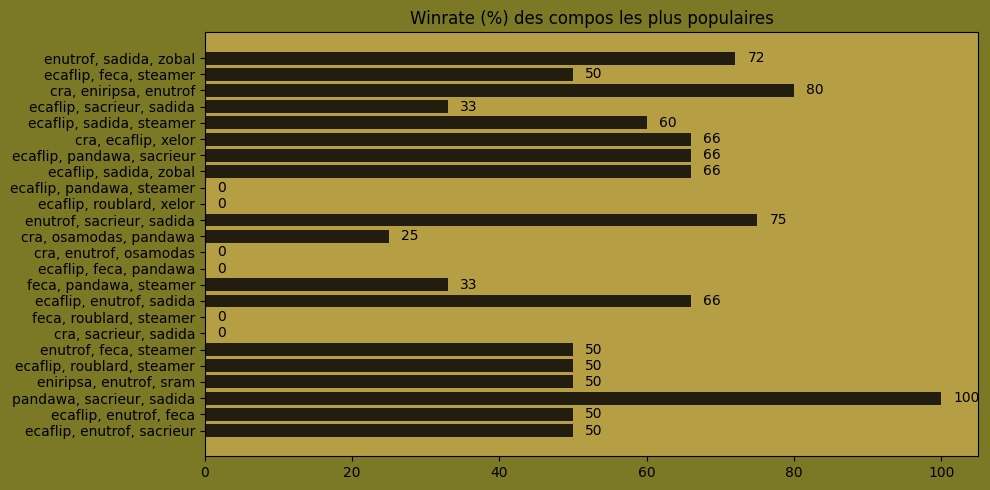

In [298]:
dict_barh(compo_wr,sortby=pickrate_compo(df,filter="auto"),title="Winrate (%) des compos les plus populaires")

# winrate par serveur

In [299]:
## winrate par compo
def winrate_serveur(df):
    
    serveur_win=dict()
    
    for idx, row in df.iterrows():
        serveur=row["serveur_team"]
        
        if str(serveur) in serveur_win.keys():
            serveur_win[str(serveur)]+=row["win"]/(row["loss"]+row["win"])
        else:
            serveur_win[str(serveur)]=row["win"]/(row["loss"]+row["win"])


    nb_team_serv=df.groupby(by=["serveur_team"]).count()["J1"].to_dict()

    serv_wr=dict()

    for k in nb_team_serv:
        serv_wr[k]=int(serveur_win[k]/nb_team_serv[k]*100)
    return serv_wr


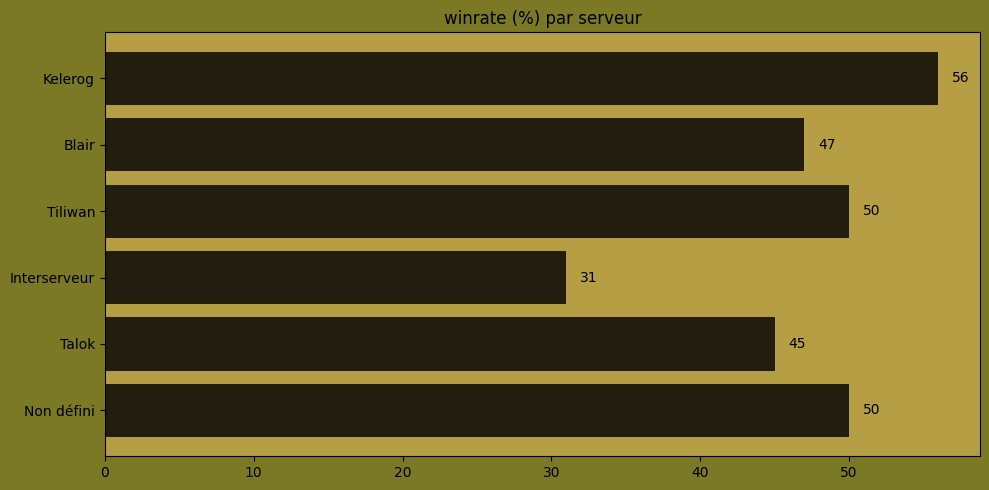

In [300]:
serv_winrate=winrate_serveur(df)
dict_barh(serv_winrate,sortby=df.groupby(by=["serveur_team"]).count()["J1"].to_dict(),title="winrate (%) par serveur")

# winrate par classe

In [301]:
## winrate par compo
def winrate_classe(df):
    
    classe_win=dict()
    list_col_classe=["classe_J1","classe_J2","classe_J3"]

    for idx, row in (df.iterrows()):
        # print(idx)
        for c in list_col_classe:
            classe=row[c]
            # print(c)
            # print(classe_win.keys())
            if str(classe) in classe_win.keys():
                classe_win[str(classe)]+=row["win"]/(row["loss"]+row["win"])
            else:
                classe_win[str(classe)]=row["win"]/(row["loss"]+row["win"])
        

    nb_classe=pickrate_classes(df)

    classe_wr=dict()

    for k in nb_classe:
        classe_wr[k]=int(classe_win[k]/nb_classe[k]*100)
    return classe_wr


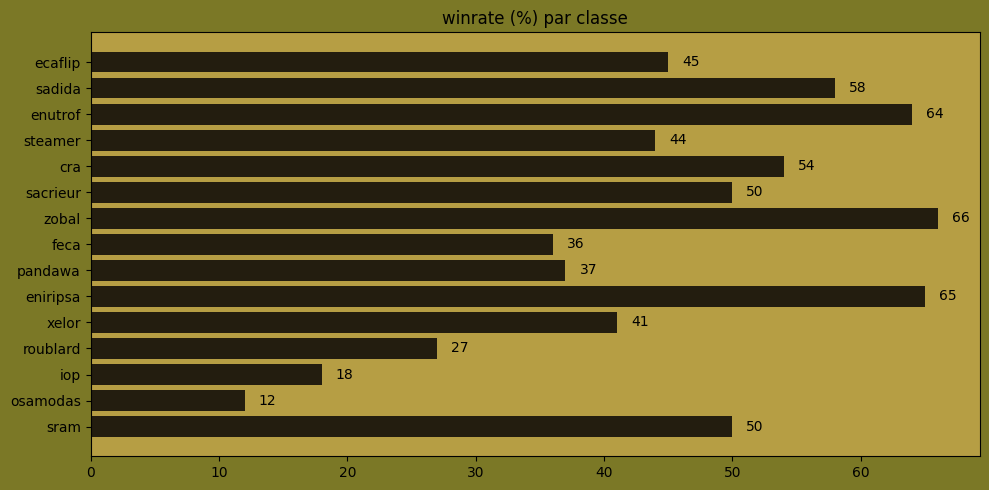

In [302]:
classe_winrate=winrate_classe(df)
dict_barh(classe_winrate,sortby=pickrate_classes(df),title="winrate (%) par classe")

In [303]:
## winrate par compo
def winrate_classe_2(df):
    
    classe_win=dict()
    classe_loss=dict()
    list_col_classe=["classe_J1","classe_J2","classe_J3"]

    for idx, row in (df.iterrows()):
        # print(idx)
        for c in list_col_classe:
            classe=row[c]
            # print(c)
            # print(classe_win.keys())
            if str(classe) in classe_win.keys():
                classe_win[str(classe)]+=row["win"]
                classe_loss[str(classe)]+=row["loss"]
            else:
                classe_win[str(classe)]=row["win"]
                classe_loss[str(classe)]=row["loss"]
        

    # nb_classe=pickrate_classes(df)

    classe_wr=dict()

    for k in classe_win.keys():
        classe_wr[k]=int(classe_win[k]/(classe_win[k]+classe_loss[k])*100)
    return classe_wr


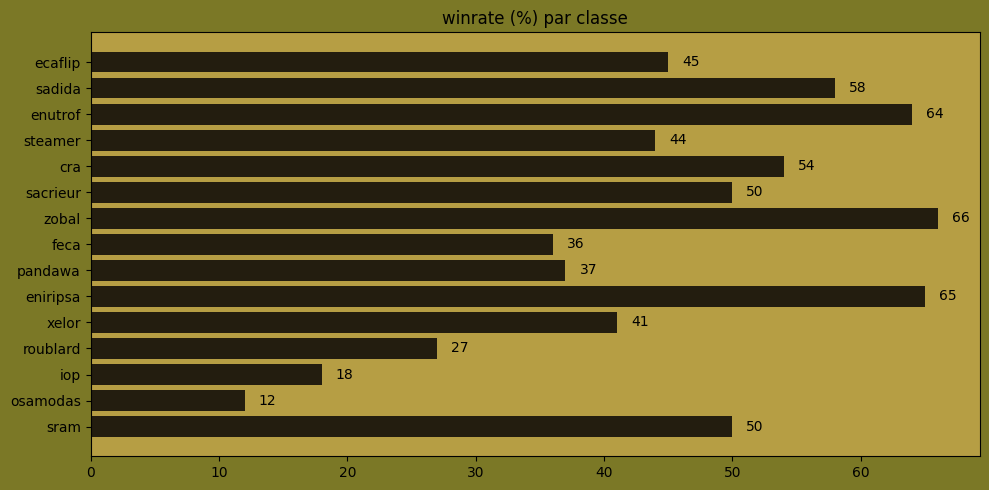

In [304]:
classe_winrate=winrate_classe_2(df)
dict_barh(classe_winrate,sortby=pickrate_classes(df),title="winrate (%) par classe")

# Winrate par duos

In [305]:
## winrate par compo
def winrate_duos(df,serveur="tous",filter=-1):
    
    if serveur!="tous":
        temp_df=df[df["serveur_team"]==serveur].copy()
        # title=serveur.upper()+" compo les plus jouées"
    else:
        temp_df=df.copy()
        # title="compo les plus jouées"

    count_win=dict()

    
    for idx, row in temp_df.iterrows():
        ss=[row["classe_J1"],row["classe_J2"],row["classe_J3"]]
        ss.sort()
        # ss={row["classe_J1"],row["classe_J2"],row["classe_J3"]}
        if len(ss)>2:
            sub_list=subsets(ss)
            for sb in sub_list:
                if str(sb) in count_win.keys():
                    count_win[str(sb)]+=row["win"]/(row["loss"]+row["win"])
                else:
                    count_win[str(sb)]=row["win"]/(row["loss"]+row["win"])

            # if str(classe) in classe_win.keys():
            #     classe_win[str(classe)]+=row["win"]/(row["loss"]+row["win"])
            # else:
            #     classe_win[str(classe)]=row["win"]/(row["loss"]+row["win"])

    if filter=="auto":
        temp_filter=0
        while(dict_count_val_over(count_win,temp_filter)>25):
            temp_filter+=1
        if temp_filter>0:
            count_win=filterTheDict(count_win, lambda elem : elem[1] > temp_filter)

    elif filter>=0:
        count_win=filterTheDict(count_win, lambda elem : elem[1] > filter)

    nb_duos=pickrate_duos(df,filter=filter)

    duos_wr=dict()

    for k in nb_duos:
        duos_wr[k]=int(count_win[k]/nb_duos[k]*100)
    return duos_wr


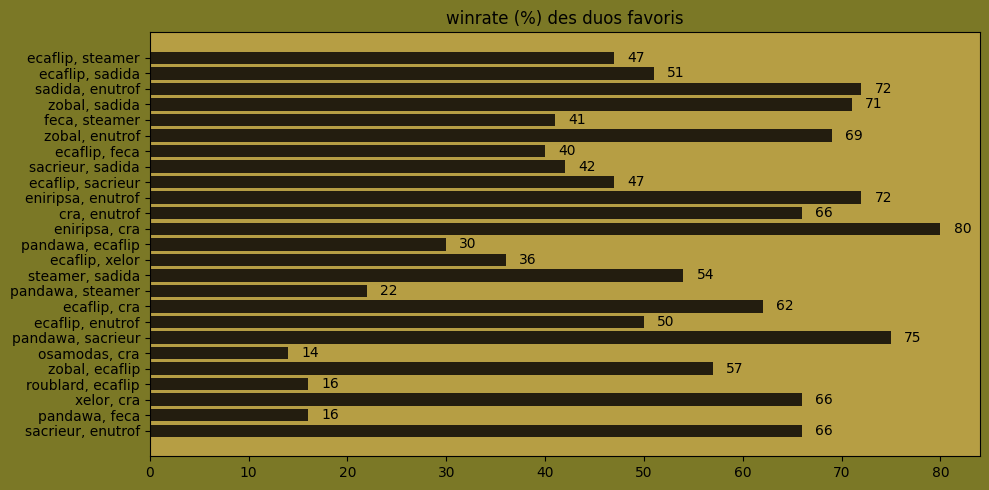

In [306]:
dict_barh(winrate_duos(df),sortby=pickrate_duos(df,filter='auto'),title='winrate (%) des duos favoris')

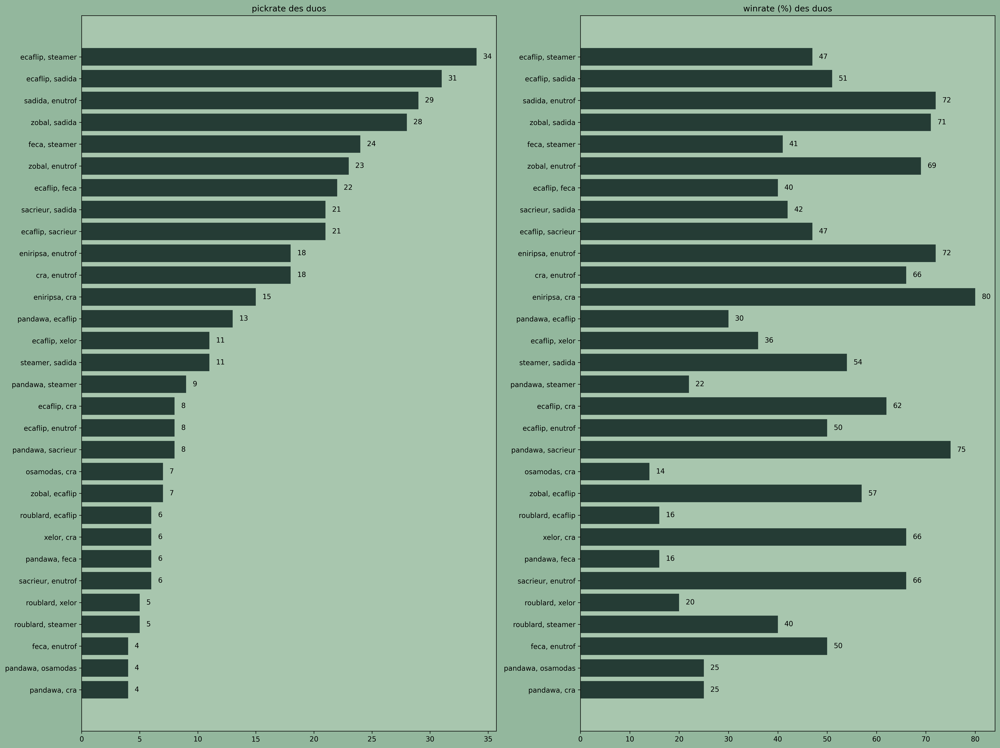

In [307]:
color_panel={"background_col":"#93B79D","plot_col":"#A8C6AE","bars_col":"#253C35"}

background_col=color_panel["background_col"]#"#B75888"
plot_col=color_panel["plot_col"]#"#DF6DBC"
bars_col=color_panel["bars_col"]#"#55185A"


fig ,axs= plt.subplots(1,2,figsize=(20,15),facecolor=background_col,dpi=300)

ax1=axs[0]
ax1.set_facecolor(plot_col)
ax1.set_title("pickrate des duos")
ax2=axs[1]
ax2.set_facecolor(plot_col)
ax2.set_title("winrate (%) des duos")

# load the dicts
pick=pickrate_duos(df, filter=3)
win=winrate_duos(df)

# sort the dicts
pick_s=dict(sorted(pick.items(), key=lambda item: item[1]))

win_s=dict()
for k in pick_s.keys():
    win_s[k]=win[k]

# plot the dicts
pick_s_i=pick_s.items()
pick_x, pick_y = zip(*pick_s_i)   
pick_x=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in pick_x]

offset_text_pick=(max(pick_y)/60)
ax1.barh(pick_x, pick_y,facecolor=bars_col)
for i in range(len(pick_x)):
    ax1.text( pick_y[i]+offset_text_pick,i, pick_y[i], ha='left',va="center",color='black')

win_s_i=win_s.items()
win_x, win_y = zip(*win_s_i)   
win_x=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in win_x]

offset_text_win=(max(win_y)/60)
ax2.barh(win_x, win_y,facecolor=bars_col)
for i in range(len(win_x)):
    ax2.text( win_y[i]+offset_text_win,i, win_y[i], ha='left',va="center",color='black')

plt.tight_layout()

plt.savefig("graphs/recapitulatif_duos"+str(r)+".png")
plt.show()

# Recap winrate

In [308]:
def recap_winrate(df):
    
    color_panel={"background_col":"#93B79D","plot_col":"#A8C6AE","bars_col":"#253C35"}
    compos=pickrate_compo(df,filter='auto')
    duos=pickrate_duos(df,filter='auto')
    nb_team=df.groupby(by=["serveur_team"]).count()["J1"].to_dict()
    nb_joueurs=sum_dict(sum_dict(df.groupby(by="serveur_J1_cleaned").count()["J1"].to_dict(),df.groupby(by="serveur_J2_cleaned").count()["J1"].to_dict()),df.groupby(by="serveur_J3_cleaned").count()["J1"].to_dict())
    
    background_col=color_panel["background_col"]#"#B75888"
    plot_col=color_panel["plot_col"]#"#DF6DBC"
    bars_col=color_panel["bars_col"]#"#55185A"
    
    fig, axs=plt.subplots(5,2,figsize=(20,30),facecolor=background_col,dpi=(300))


    #########################################
    #Classes
    #########################################
    classes=pickrate_classes(df)

    classes_ax=axs[3][0]
    classes_ax.set_facecolor(plot_col)
    classes_ax.set_title("pickrate des classes")
    classes_s=dict(sorted(classes.items(), key=lambda item: item[1]))
    classes_s_i=classes_s.items()
    classes_x, classes_y = zip(*classes_s_i)   

    offset_text_classes=(max(classes_y)/60)


    classes_ax.barh(classes_x, classes_y,facecolor=bars_col)
    for i in range(len(classes_x)):
        classes_ax.text( classes_y[i]+offset_text_classes,i, classes_y[i], ha='left',va="center",color='black')


    #########################################
    #winrate classe
    #########################################
    classe_wr=winrate_classe(df)

    classes_wr_ax=axs[3][1]
    classes_wr_ax.set_facecolor(plot_col)
    classes_wr_ax.set_title("winrate (%) des classes")


    # classes_wr_s=dict(sorted(classe_wr.items(), key=lambda item: item[1]))
    classes_wr_s=dict()
    for k in classes_s.keys():
        classes_wr_s[k]=classe_wr[k]

    classes_s_i=classes_wr_s.items()
    classes_x, classes_y = zip(*classes_s_i)   

    offset_text_classes=(max(classes_y)/60)


    classes_wr_ax.barh(classes_x, classes_y,facecolor=bars_col)
    for i in range(len(classes_x)):
        classes_wr_ax.text( classes_y[i]+offset_text_classes,i, classes_y[i], ha='left',va="center",color='black')

    #########################################
    #Compos
    #########################################

    compo_ax=axs[2][0]
    compo_ax.set_facecolor(plot_col)
    compo_ax.set_title("pickrate des compos")
    compos_s=dict(sorted(compos.items(), key=lambda item: item[1]))
    compos_s_i=compos_s.items()
    compos_x, compos_y = zip(*compos_s_i)   
    compos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in compos_x]

    offset_text_compos=(max(compos_y)/60)


    compo_ax.barh(compos_x_strip, compos_y,facecolor=bars_col)
    for i in range(len(compos_x)):
        compo_ax.text( compos_y[i]+offset_text_compos,i, compos_y[i], ha='left',va="center",color='black')


    #########################################
    #Compos winrate
    #########################################
    compos_wr=winrate_compo(df)

    compo_wr_ax=axs[2][1]
    compo_wr_ax.set_facecolor(plot_col)
    compo_wr_ax.set_title("winrate (%) des compos")

    # compos_s=dict(sorted(compos_wr.items(), key=lambda item: item[1]))
    compos_wr_s=dict()
    for k in compos_s.keys():
        compos_wr_s[k]=compos_wr[k]

    compos_s_i=compos_wr_s.items()
    compos_x, compos_y = zip(*compos_s_i)   
    compos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in compos_x]

    offset_text_compos=(max(compos_y)/60)


    compo_wr_ax.barh(compos_x_strip, compos_y,facecolor=bars_col)
    for i in range(len(compos_x)):
        compo_wr_ax.text( compos_y[i]+offset_text_compos,i, compos_y[i], ha='left',va="center",color='black')


    #########################################
    #Duos
    #########################################

    duo_ax=axs[4][0]
    duo_ax.set_facecolor(plot_col)
    duo_ax.set_title("pickrate des duos")
    duos_s=dict(sorted(duos.items(), key=lambda item: item[1]))
    duos_s_i=duos_s.items()
    duos_x, duos_y = zip(*duos_s_i)   
    duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_duos=(max(duos_y)/60)


    duo_ax.barh(duos_x_strip, duos_y,facecolor=bars_col)
    for i in range(len(duos_x)):
        duo_ax.text( duos_y[i]+offset_text_duos,i, duos_y[i], ha='left',va="center",color='black')


    #########################################
    #Duos winrate
    #########################################
    duos_wr= winrate_duos(df)

    duo_wr_ax=axs[4][1]
    duo_wr_ax.set_facecolor(plot_col)
    duo_wr_ax.set_title("winrate (%) des duos")


    # duos_s=dict(sorted(duos_wr.items(), key=lambda item: item[1]))
    duos_wr_s=dict()
    for k in duos_s.keys():
        duos_wr_s[k]=duos_wr[k]
    
    duos_s_i=duos_wr_s.items()
    duos_x, duos_y = zip(*duos_s_i)   
    duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_duos=(max(duos_y)/60)


    duo_wr_ax.barh(duos_x_strip, duos_y,facecolor=bars_col)
    for i in range(len(duos_x)):
        duo_wr_ax.text( duos_y[i]+offset_text_duos,i, duos_y[i], ha='left',va="center",color='black')

    #########################################
    #nombre de team par serveur
    #########################################

    nbteam_ax=axs[1][0]
    nbteam_ax.set_facecolor(plot_col)
    nbteam_ax.set_title("nombre de teams par serveur")
    team_s=dict(sorted(nb_team.items(), key=lambda item: item[1]))
    team_s_i=team_s.items()
    team_x, team_y = zip(*team_s_i)   

    offset_text_team=(max(team_y)/60)


    nbteam_ax.barh(team_x, team_y,facecolor=bars_col)
    for i in range(len(team_x)):
        nbteam_ax.text( team_y[i]+offset_text_team,i, team_y[i], ha='left',va="center",color='black')


    #########################################
    #winrate par serveur
    #########################################

    serv_wr=winrate_serveur(df)

    serv_wr_ax=axs[1][1]
    serv_wr_ax.set_facecolor(plot_col)
    serv_wr_ax.set_title("winrate (%) par serveur")

    # team_s=dict(sorted(serv_wr.items(), key=lambda item: item[1]))
    serv_wr_s=dict()
    for k in team_s.keys():
        serv_wr_s[k]=serv_wr[k]

    serv_wr_s_i=serv_wr_s.items()
    team_x, team_y = zip(*serv_wr_s_i)   

    offset_text_team=(max(team_y)/60)


    serv_wr_ax.barh(team_x, team_y,facecolor=bars_col)
    for i in range(len(team_x)):
        serv_wr_ax.text( team_y[i]+offset_text_team,i, team_y[i], ha='left',va="center",color='black')


    #########################################
    #nombre de joueur par serveur
    #########################################

    nb_joueurs_ax=axs[0][1]
    nb_joueurs_ax.set_facecolor(plot_col)
    nb_joueurs_ax.set_title("nombre de joueurs par serveur")
    joueurs_s=dict(sorted(nb_joueurs.items(), key=lambda item: item[1]))
    joueurs_s_i=joueurs_s.items()
    joueurs_x, joueurs_y = zip(*joueurs_s_i)   

    offset_text_joueurs=(max(joueurs_y)/60)


    nb_joueurs_ax.barh(joueurs_x, joueurs_y,facecolor=bars_col)
    for i in range(len(joueurs_x)):
        nb_joueurs_ax.text( joueurs_y[i]+offset_text_joueurs,i, joueurs_y[i], ha='left',va="center",color='black')


    #########################################
    #image
    #########################################

    #Imageplt.imshow(mpimg.imread('MyImage.png'))
    axs[0][0].imshow(mpimg.imread("images/interserveur.jpg"))#+".jpg"))
    axs[0][0].get_xaxis().set_visible(False)
    axs[0][0].get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.savefig("graphs/recapitulatif_winrates_ronde_"+str(r)+".jpg")
    plt.show()

In [309]:
recap_winrate(df)

In [310]:
dudududu=pickrate_duos(df)
len(dudududu)

61

# winrate serveur vs serveur

In [311]:
def winrate_vs_the_world(df,serveur,nb_ronde):
    list_serv=list(df["serveur_team"].unique())
    list_serv.remove(serveur)
    winrate_d=dict() #wDodge increase by 1 if a team from serveur wins vs a team from Dodge
    for s in list_serv:
        winrate_d['w'+s]=0
        winrate_d["l"+s]=0
    
    for i in range(nb_ronde):
        ronde_res=pd.read_excel('resultats_ronde'+str(i+1)+'.xlsx',usecols=['equipe A','equipe B','vainqueur'])

        for idx, row in ronde_res.iterrows():
            # print(idx,row)
            if row["equipe A"]=="BYE" or row["equipe B"]=='BYE':
                pass
            else:
                serv_A=df.loc[row["equipe A"],"serveur_team"]
                serv_B=df.loc[row["equipe B"],"serveur_team"]

                if serv_A==serveur and serv_B!=serveur:
                    if row["equipe A"]==row["vainqueur"]:
                        winrate_d["w"+serv_B]+=1
                    else:
                        winrate_d["l"+serv_B]+=1

                elif serv_B==serveur and serv_A!=serveur:
                    if row["equipe B"]==row["vainqueur"]:
                        winrate_d["w"+serv_A]+=1
                    else:
                        winrate_d["l"+serv_A]+=1
        # print("ronde "+str(i+1)+" ok")

    winrate_final=dict()
    nb_rencontres=dict()
    for s in list_serv:
        if winrate_d['w'+s]>0 or winrate_d['l'+s]:
            winrate_final[s]=int(winrate_d['w'+s]/(winrate_d['w'+s]+winrate_d['l'+s])*100)
        else:
            winrate_final[s]=0
        nb_rencontres[s]=winrate_d['w'+s]+winrate_d['l'+s]

    return winrate_final,nb_rencontres
        



        

In [312]:
wr_f,nb_r=winrate_vs_the_world(df,'Kelerog',nb_ronde)

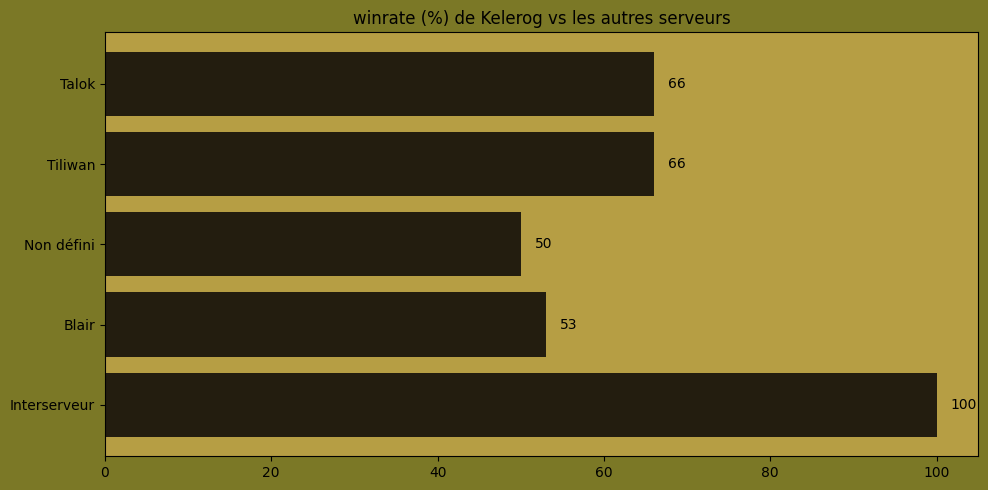

In [313]:
dict_barh(wr_f,title='winrate (%) de Kelerog vs les autres serveurs')

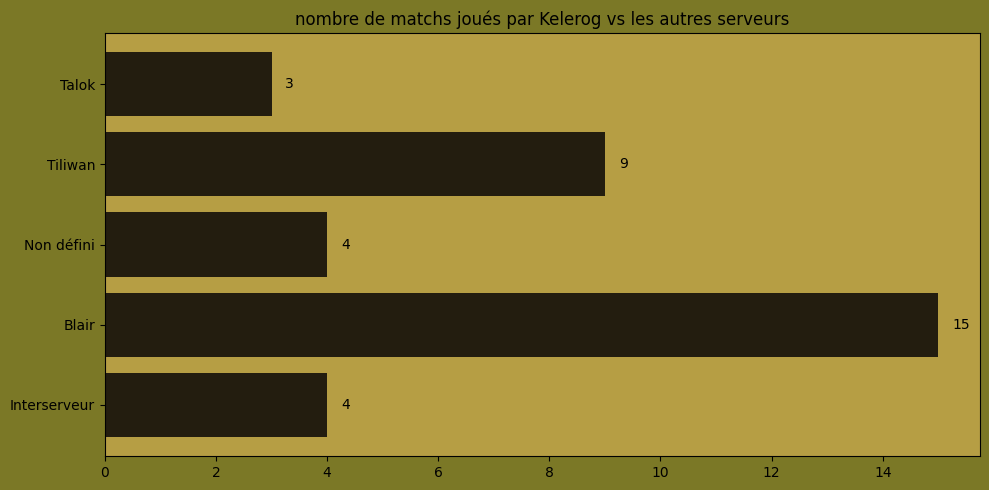

In [314]:
dict_barh(nb_r,'nombre de matchs joués par Kelerog vs les autres serveurs')

# recap serveur vs the world

In [315]:
def recap_serv_vs_the_world(df,serv,color_panel={"background_col":"#93B79D","plot_col":"#A8C6AE","bars_col":"#253C35"}):
    classes=pickrate_classes(df,serv)
    compos=pickrate_compo(df,serv,filter='auto')
    duos=pickrate_duos(df,serv,filter='auto')

    background_col=color_panel["background_col"]#"#B75888"
    plot_col=color_panel["plot_col"]#"#DF6DBC"
    bars_col=color_panel["bars_col"]#"#55185A"
    
    fig, axs=plt.subplots(3,2,figsize=(20,15),facecolor=background_col)

    #Classes
    axs[0][1].set_facecolor(plot_col)
    axs[0][1].set_title("pickrate des classes")
    classes_s=dict(sorted(classes.items(), key=lambda item: item[1]))
    classes_s_i=classes_s.items()
    classes_x, classes_y = zip(*classes_s_i)   
    classes_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in classes_x]

    offset_text_classes=(max(classes_y)/60)


    axs[0][1].barh(classes_x_strip, classes_y,facecolor=bars_col)
    for i in range(len(classes_x)):
        axs[0][1].text( classes_y[i]+offset_text_classes,i, classes_y[i], ha='left',va="center",color='black')

    #Compos
    axs[1][0].set_facecolor(plot_col)
    axs[1][0].set_title("pickrate des compos")
    compos_s=dict(sorted(compos.items(), key=lambda item: item[1]))
    compos_s_i=compos_s.items()
    compos_x, compos_y = zip(*compos_s_i)   
    compos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in compos_x]

    offset_text_compos=(max(compos_y)/60)


    axs[1][0].barh(compos_x_strip, compos_y,facecolor=bars_col)
    for i in range(len(compos_x)):
        axs[1][0].text( compos_y[i]+offset_text_compos,i, compos_y[i], ha='left',va="center",color='black')

    #Duos
    axs[1][1].set_facecolor(plot_col)
    axs[1][1].set_title("pickrate des duos")
    duos_s=dict(sorted(duos.items(), key=lambda item: item[1]))
    duos_s_i=duos_s.items()
    duos_x, duos_y = zip(*duos_s_i)   
    duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_duos=(max(duos_y)/60)


    axs[1][1].barh(duos_x_strip, duos_y,facecolor=bars_col)
    for i in range(len(duos_x)):
        axs[1][1].text( duos_y[i]+offset_text_duos,i, duos_y[i], ha='left',va="center",color='black')

    #winrate serveurs

    wr_f,nb_r=winrate_vs_the_world(df,serv,nb_ronde)

    aw_winrate=axs[2][0]
    aw_winrate.set_facecolor(plot_col)
    aw_winrate.set_title("winrate (%) vs chaque serveur")
    # wr_f_s=dict(sorted(wr_f.items(), key=lambda item: item[1]))
    wr_f_s_i=wr_f.items()
    wr_f_x, wr_f_y = zip(*wr_f_s_i)   
    # duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_wr=(max(wr_f_y)/60)


    aw_winrate.barh(wr_f_x, wr_f_y,facecolor=bars_col)
    for i in range(len(wr_f_x)):
        aw_winrate.text( wr_f_y[i]+offset_text_wr,i, wr_f_y[i], ha='left',va="center",color='black')

    # nb rencontres serveurs
    aw_rencontres=axs[2][1]
    aw_rencontres.set_facecolor(plot_col)
    aw_rencontres.set_title("nombre de matchs face à chaque serveur")
    # nb_r_s=dict(sorted(duos.items(), key=lambda item: item[1]))
    nb_r_i=nb_r.items()
    nb_r_x, nb_r_y = zip(*nb_r_i)   
    # duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_renc=(max(nb_r_y)/60)


    aw_rencontres.barh(nb_r_x, nb_r_y,facecolor=bars_col)
    for i in range(len(nb_r_x)):
        aw_rencontres.text( nb_r_y[i]+offset_text_renc,i, nb_r_y[i], ha='left',va="center",color='black')

    #Imageplt.imshow(mpimg.imread('MyImage.png'))
    try:
        axs[0][0].imshow(mpimg.imread("images/4_"+serv.lower()+".png"))
    except:
        axs[0][0].imshow(mpimg.imread("images/Interserveur.jpg"))

    # axs[0][0].imshow(mpimg.imread("images/"+serv+".jpg"))
    axs[0][0].get_xaxis().set_visible(False)
    axs[0][0].get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.savefig("graphs/"+serv.replace(" ","_")+"_recaputilatif.png")
    plt.show()

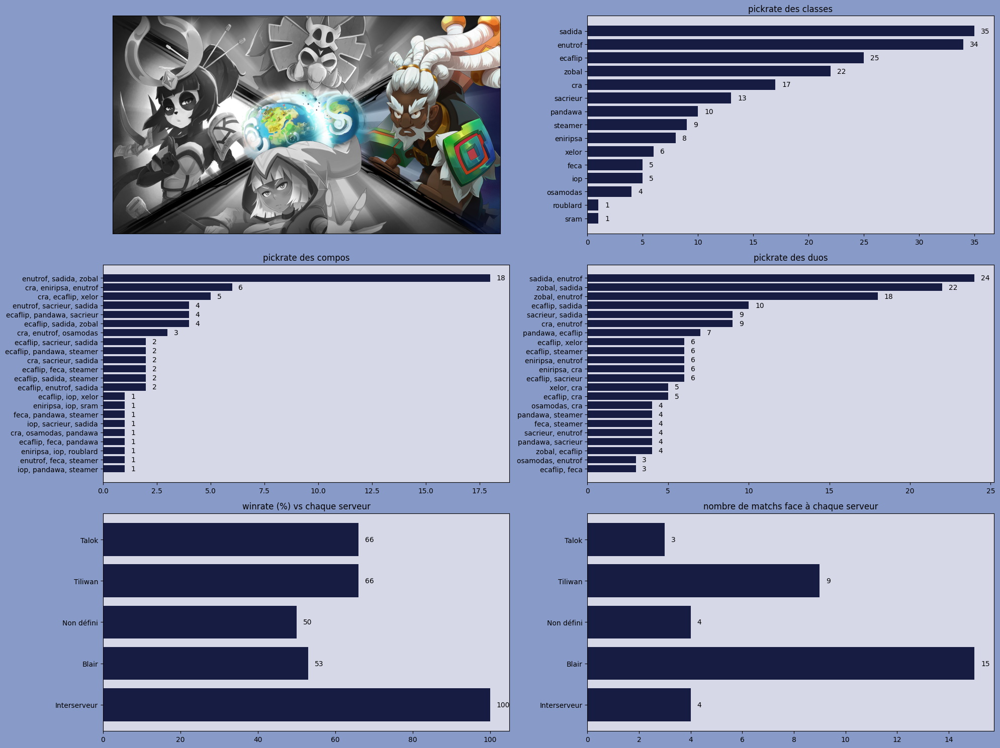

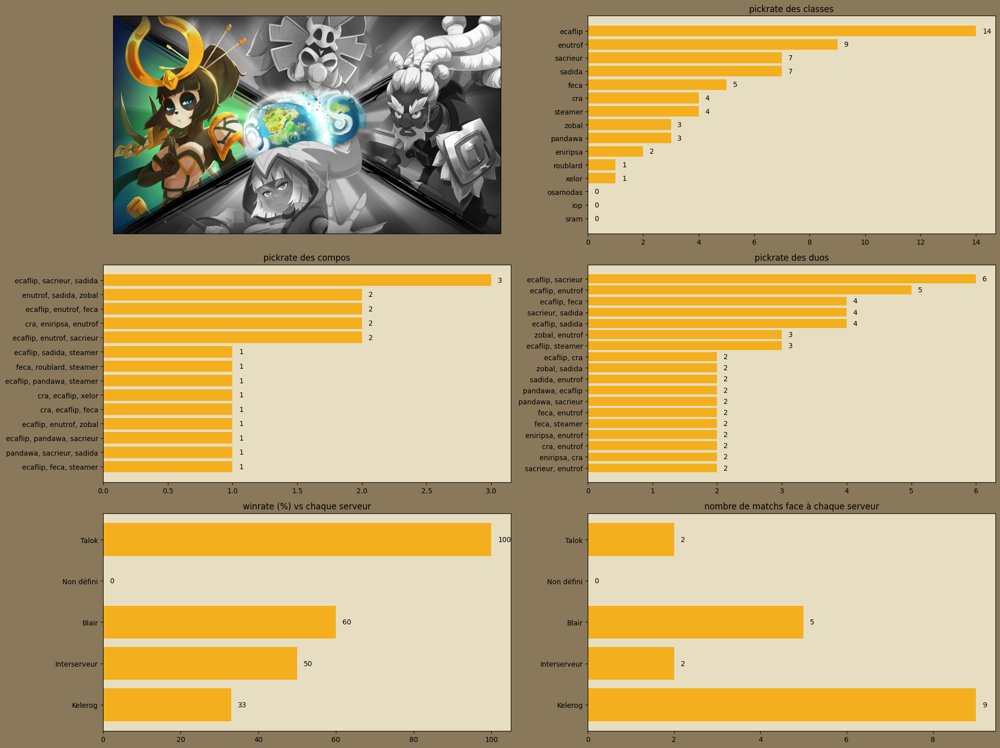

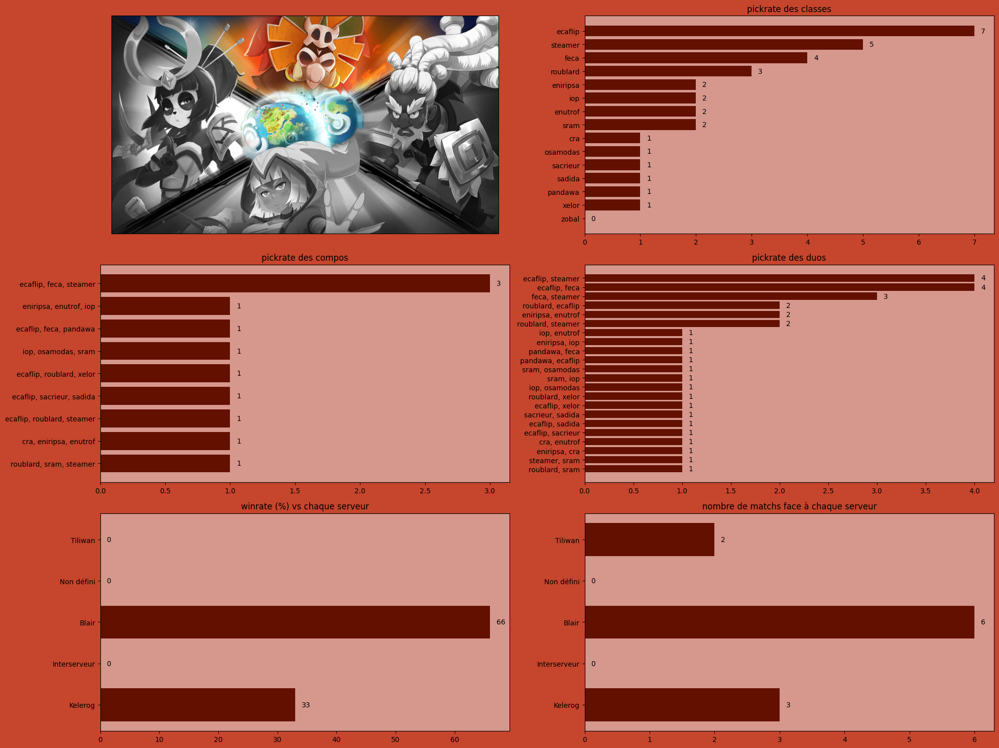

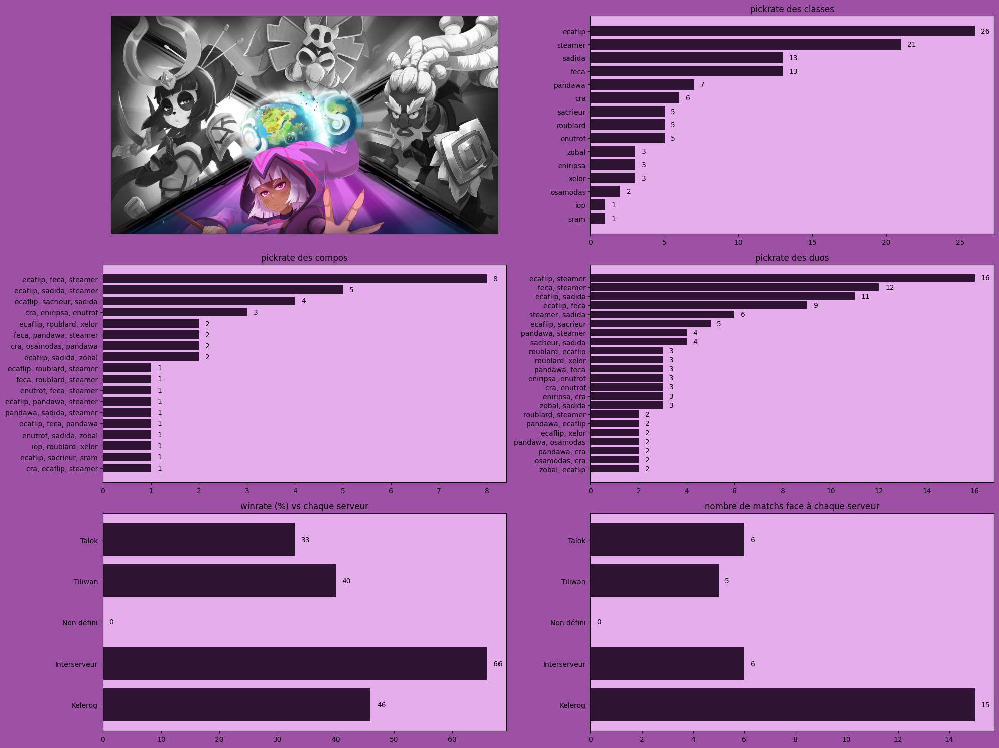

In [316]:
herde_panel={
    "background_col":"#B75888",
    "plot_col":"#DF6DBC",
    "bars_col":"#55185A" 
}   
oshi_panel={
    "background_col":"#588791",
    "plot_col":"#5A9CA8",
    "bars_col":"#162f3f" 
}   
terra_panel={
    "background_col":"#7F4C34",
    "plot_col":"#DCB47B",
    "bars_col":"#672C1C" 
}   
granda_panel={
    "background_col":"#7B7826",
    "plot_col":"#B69E44",
    "bars_col":"#231D0F" 
}   
brutas_panel={
    "background_col":"#C76048",
    "plot_col":"#F9B67E",
    "bars_col":"#55201C" 
}   
inter_panel={
    "background_col":"#93B79D",
    "plot_col":"#A8C6AE",
    "bars_col":"#253C35" 
}   


recap_serv_vs_the_world(df,"Kelerog",kele_panel)
recap_serv_vs_the_world(df,"Tiliwan",tili_panel)
recap_serv_vs_the_world(df,"Talok",talok_panel)
recap_serv_vs_the_world(df,"Blair",blair_panel)

# recap_serv_vs_the_world(df,"Herdegrize",herde_panel)
# recap_serv_vs_the_world(df,"Oshimo",oshi_panel)
# recap_serv_vs_the_world(df,"Terra Cogita",terra_panel)
# recap_serv_vs_the_world(df,"Grandapan",granda_panel)
# recap_serv_vs_the_world(df,"Dodge",inter_panel)
# recap_serv_vs_the_world(df,"Brutas",brutas_panel)
# recap_serv(df)

# BREAK

In [322]:
azd

NameError: name 'azd' is not defined

# composition des serveurs parmis les 32 premières équipes

In [317]:
leaderboard=pd.read_excel("leaderboard_r"+str(r)+".xlsx")

qualifiés=leaderboard[leaderboard["rank"]<33]
qualifiés

,rank,team,points,pva,forfeit_number
0,1,Dark-society,3,0%,0
1,1,CHARGEEEER,3,0%,0
2,1,GEOS,3,0%,0
3,1,protoStorm,3,0%,0
4,1,Apuestas de Brutas,3,0%,0
...,...,...,...,...,...
72,1,FINITO TERMINE,3,0%,0
73,1,Abstract,3,0%,0
74,1,Les Lamas,3,0%,0
75,1,La vie c harr,3,0%,0


In [318]:
qualifiés["serveur_team"]=qualifiés["team"].apply(lambda t : df.loc[t,'serveur_team'])

C:\Users\Joannes\AppData\Local\Temp\ipykernel_50844\57842012.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qualifiés["serveur_team"]=qualifiés["team"].apply(lambda t : df.loc[t,'serveur_team'])


In [319]:
qualifiés

,rank,team,points,pva,forfeit_number,serveur_team
0,1,Dark-society,3,0%,0,Kelerog
1,1,CHARGEEEER,3,0%,0,Kelerog
2,1,GEOS,3,0%,0,Interserveur
3,1,protoStorm,3,0%,0,Blair
4,1,Apuestas de Brutas,3,0%,0,Blair
...,...,...,...,...,...,...
72,1,FINITO TERMINE,3,0%,0,Kelerog
73,1,Abstract,3,0%,0,Talok
74,1,Les Lamas,3,0%,0,Kelerog
75,1,La vie c harr,3,0%,0,Kelerog


In [320]:
qualif_serv_dict=dict()
for sese in list_serv:
    qualif_serv_dict[sese]=qualifiés[qualifiés["serveur_team"]==sese]["team"].count()

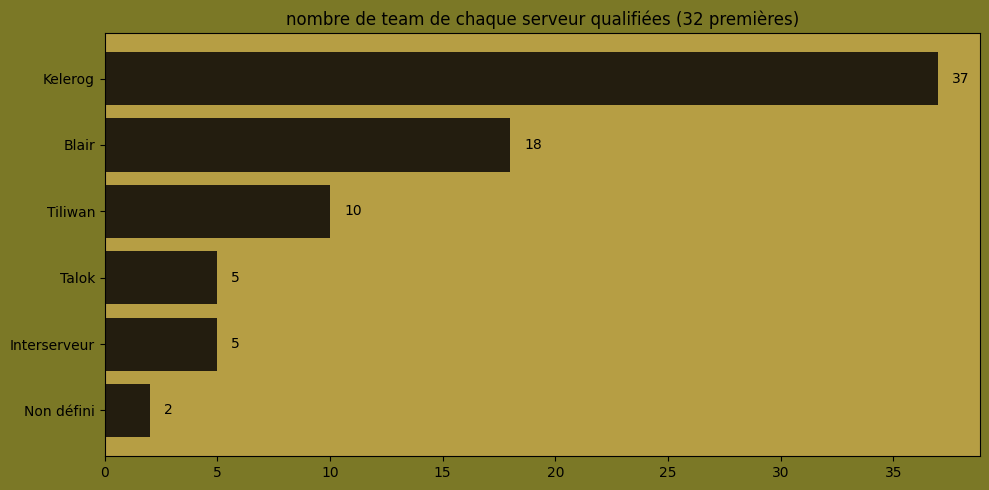

In [321]:
dict_barh(qualif_serv_dict,title="nombre de team de chaque serveur qualifiées (32 premières)",sort=True)

# répartition des classes dans les 32 premières équipes

In [ ]:
qualifiés.loc[:,"classe_J1"]=qualifiés["team"].apply(lambda t : df.loc[t,'classe_J1'])
qualifiés.loc[:,"classe_J2"]=qualifiés["team"].apply(lambda t : df.loc[t,'classe_J2'])
qualifiés.loc[:,"classe_J3"]=qualifiés["team"].apply(lambda t : df.loc[t,'classe_J3'])
qualifiés

c:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


,rank,team,points,pva,forfeit_number,serveur_team,classe_J1,classe_J2,classe_J3
0,1,Fox-ez,27,70%,0,Terra Cogita,enutrof,eniripsa,iop
1,2,Finito La Comedia,25,63.98%,0,Herdegrize,feca,ecaflip,osamodas
2,3,Chartered,24,69%,0,Dodge,xelor,eniripsa,iop
3,4,Full Counter,24,67.5%,0,Herdegrize,osamodas,pandawa,feca
4,5,Du nord au sud,24,65%,0,Terra Cogita,osamodas,ecaflip,feca
5,6,LES LASCARS,24,64%,0,Herdegrize,feca,osamodas,iop
6,7,Les Lamas,24,62.63%,0,Terra Cogita,osamodas,ecaflip,feca
7,8,Sambayoyo,24,61.5%,0,Brutas,ecaflip,osamodas,feca
8,9,Hagra time,24,61.34%,0,Terra Cogita,xelor,zobal,steamer
9,10,Violencia,24,51.03%,0,Non défini,osamodas,feca,ecaflip


In [ ]:
pickrate_classes(qualifiés)

{'zobal': 8,
 'iop': 7,
 'pandawa': 6,
 'sadida': 3,
 'sacrieur': 2,
 'roublard': 0,
 'steamer': 9,
 'ecaflip': 16,
 'enutrof': 2,
 'xelor': 8,
 'cra': 0,
 'osamodas': 16,
 'eniripsa': 2,
 'feca': 17,
 'sram': 0}

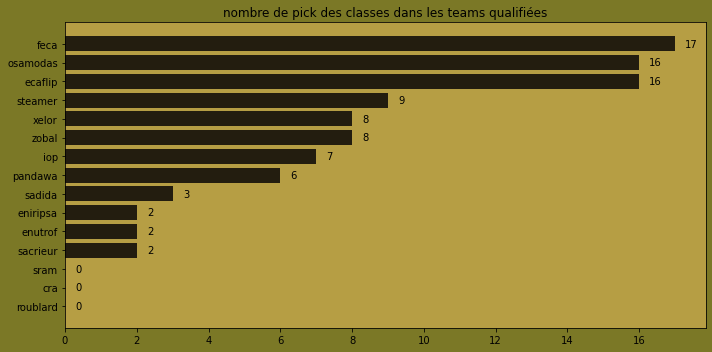

In [ ]:
dict_barh(pickrate_classes(qualifiés),sort=True,title="nombre de pick des classes dans les teams qualifiées")

# répartition des compos dans les 32 premières équipes

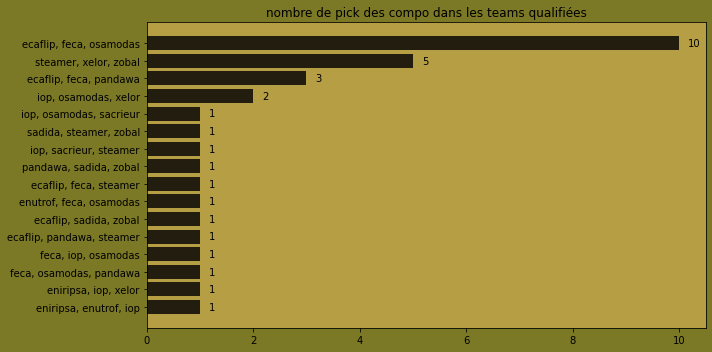

In [ ]:
dict_barh(pickrate_compo(qualifiés,filter="auto"),sort=True,title="nombre de pick des compo dans les teams qualifiées")

# répartition des duos dans les 32 premières équipes

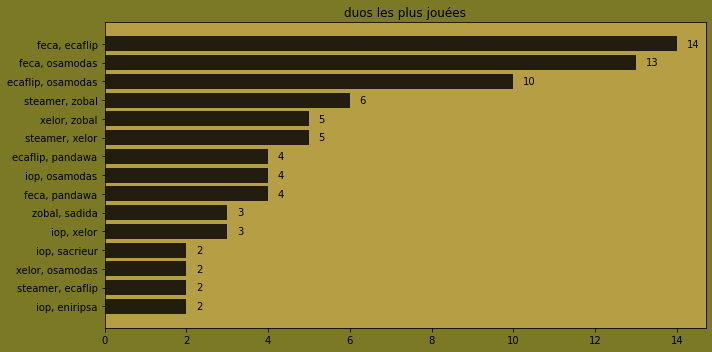

In [ ]:
dict_barh(pickrate_duos(qualifiés,filter="auto"),sort=True,title="duos les plus jouées")

# recap stats teams qualifiées

In [ ]:
def recap_stats_teams_qualifies(df,serv='tous',color_panel={"background_col":"#93B79D","plot_col":"#A8C6AE","bars_col":"#253C35"}):
    classes=pickrate_classes(df,serv)
    compos=pickrate_compo(df,serv,filter='auto')
    duos=pickrate_duos(df,serv,filter='auto')
    
    #nb de team de chaque serveur qualifiées
    qualif_serv_dict=dict()
    for sese in list_serv:
        qualif_serv_dict[sese]=qualifiés[qualifiés["serveur_team"]==sese]["team"].count()

    background_col=color_panel["background_col"]#"#B75888"
    plot_col=color_panel["plot_col"]#"#DF6DBC"
    bars_col=color_panel["bars_col"]#"#55185A"
    
    fig, axs=plt.subplots(3,2,figsize=(20,15),facecolor=background_col)

    #Classes
    ax_classes=axs[1][0]
    ax_classes.set_facecolor(plot_col)
    ax_classes.set_title("nombre de pick des classes dans les teams qualifiées")
    classes_s=dict(sorted(classes.items(), key=lambda item: item[1]))
    classes_s_i=classes_s.items()
    classes_x, classes_y = zip(*classes_s_i)   
    classes_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in classes_x]

    offset_text_classes=(max(classes_y)/60)


    ax_classes.barh(classes_x_strip, classes_y,facecolor=bars_col)
    for i in range(len(classes_x)):
        ax_classes.text( classes_y[i]+offset_text_classes,i, classes_y[i], ha='left',va="center",color='black')

    #Compos
    ax_compo=axs[2][0]
    ax_compo.set_facecolor(plot_col)
    ax_compo.set_title("nombre de pick des compos dans les teams qualifiées")
    compos_s=dict(sorted(compos.items(), key=lambda item: item[1]))
    compos_s_i=compos_s.items()
    compos_x, compos_y = zip(*compos_s_i)   
    compos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in compos_x]

    offset_text_compos=(max(compos_y)/60)


    ax_compo.barh(compos_x_strip, compos_y,facecolor=bars_col)
    for i in range(len(compos_x)):
        ax_compo.text( compos_y[i]+offset_text_compos,i, compos_y[i], ha='left',va="center",color='black')

    #Duos
    ax_duo=axs[2][1]
    ax_duo.set_facecolor(plot_col)
    ax_duo.set_title("nombre de pick des duos dans les teams qualifiées")
    duos_s=dict(sorted(duos.items(), key=lambda item: item[1]))
    duos_s_i=duos_s.items()
    duos_x, duos_y = zip(*duos_s_i)   
    duos_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in duos_x]

    offset_text_duos=(max(duos_y)/60)


    ax_duo.barh(duos_x_strip, duos_y,facecolor=bars_col)
    for i in range(len(duos_x)):
        ax_duo.text( duos_y[i]+offset_text_duos,i, duos_y[i], ha='left',va="center",color='black')

    #serveurs

    ax_serv=axs[1][1]
    ax_serv.set_facecolor(plot_col)
    ax_serv.set_title("nombre de team de chaque serveur qualifiées")
    serv_s=dict(sorted(qualif_serv_dict.items(), key=lambda item: item[1]))
    serv_s_i=serv_s.items()
    serv_x, serv_y = zip(*serv_s_i)   
    serv_x_strip=[k.replace("{","").replace("}","").replace('"',"").replace("'","").replace("[","").replace("]","") for k in serv_x]

    offset_text_serv=(max(serv_y)/60)


    ax_serv.barh(serv_x_strip, serv_y,facecolor=bars_col)
    for i in range(len(serv_x)):
        ax_serv.text( serv_y[i]+offset_text_serv,i, serv_y[i], ha='left',va="center",color='black')
    
    #classement
    ax_classement=axs[0][1]
    ax_classement.set_facecolor(plot_col)
    # ax_classement.set_title("classement")
    # fig.patch.set_visible(False)
    ax_classement.axis('off')
    ax_classement.axis('tight')

    df_test = qualifiés[qualifiés["rank"]<17][["rank","team"]]
    df_test["rank2"]=qualifiés[qualifiés["rank"]>=17]["rank"].to_list()
    df_test["team2"]=qualifiés[qualifiés["rank"]>=17]["team"].to_list()
    columns_tab=["rank","team","rank","team"]
    # print(df_test.values)
    ax_classement.table(cellText=df_test.values, colLabels=columns_tab, loc='center',colColours=[plot_col]*4,cellColours=[[background_col] * 4,[plot_col] * 4] * 8)# ,colWidths=[0.2,1,0.2,1]
    

    #Imageplt.imshow(mpimg.imread('MyImage.png'))
    axs[0][0].imshow(mpimg.imread("images/"+serv+".jpg"))
    axs[0][0].get_xaxis().set_visible(False)
    axs[0][0].get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.savefig("graphs/recaputilatif_qualifies_r"+str(r)+".png")
    plt.show()

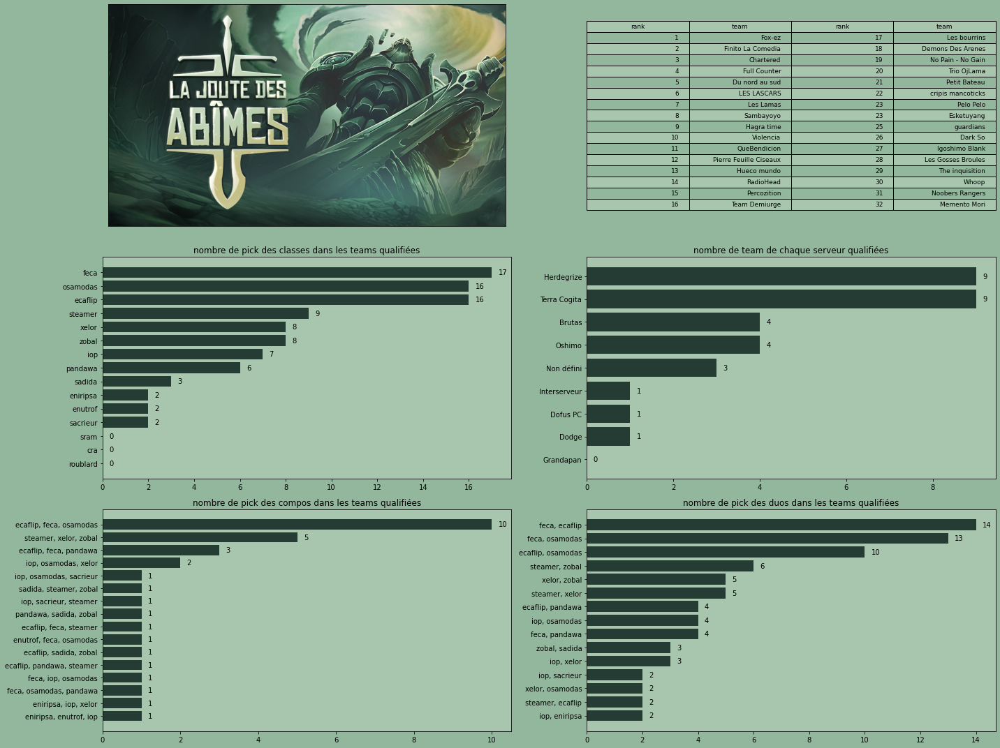

In [ ]:
recap_stats_teams_qualifies(qualifiés)